# IMPORTING LIBRARIES AND UPLOADING DATASETS

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
import category_encoders as ce
import featuretools as ft
import re

In [319]:
# loading dataset
paygo =  pd.read_csv("metadata.csv")
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3343: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,ID,RegistrationDate,Deposit,UpsellDate,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,Town,Occupation,SupplierName,Term,TotalContractValue,ExpectedTermDate,FirstPaymentDate,LastPaymentDate
0,ID_K00S4N4,2015-12-10 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,Embu,Other,d_light,364,14740.0,2016-12-08 00:00:00,2015-12-10 09:52:35,2016-10-23 04:52:30
1,ID_6L67PAA,2015-12-09 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,Kilifi,Other,d_light,364,14740.0,2016-12-07 00:00:00,2015-12-09 13:14:03,2020-05-24 15:32:18
2,ID_102CV85,2015-12-18 00:00:00,2000,2018-03-29 10:14:58,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,Makueni,Business,d_light,392,29480.0,2017-01-13 00:00:00,2015-12-18 06:22:34,2017-02-01 15:23:44
3,ID_HXBJFHB,2015-11-25 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,UNKNOWN,Teacher,d_light,364,14740.0,2016-11-23 00:00:00,2015-11-25 13:25:57,2017-05-22 16:46:54
4,ID_3K9VZ5J,2015-12-02 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,Kirinyaga,Other,d_light,364,14740.0,2016-11-30 00:00:00,2015-12-05 10:34:32,2017-05-12 16:50:52
5,ID_VJ80SX2,2015-12-14 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,Embu,Business,d_light,364,14740.0,2016-12-12 00:00:00,2015-12-14 14:20:26,2016-12-12 11:59:20
6,ID_6YU5YRB,2015-12-10 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,Meru,Other,d_light,364,14740.0,2016-12-08 00:00:00,2015-12-10 15:15:16,2016-12-11 11:48:01
7,ID_FK5A5E9,2015-12-11 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,Embu,Other,d_light,364,14740.0,2016-12-09 00:00:00,2015-12-11 10:34:10,2017-01-08 15:50:18
8,ID_7OU9HLK,2015-12-06 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,Embu,Business,d_light,364,14740.0,2016-12-04 00:00:00,2015-12-06 16:41:21,2020-07-22 07:08:17
9,ID_WVWTPGK,2015-12-05 00:00:00,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,Kirinyaga,Other,d_light,364,14740.0,2016-12-03 00:00:00,2015-12-04 18:11:33,2017-05-17 16:26:08


In [320]:
# description of dataset
paygo.describe()

,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue
count,37343.000000,37343.000000,37343.000000,37343.000000,30404.000000,37343.000000,37343.000000
mean,2348.631685,1.136090,49.923868,4.600835,38.855677,412.427657,22953.005142
std,417.814614,7.791789,57.500215,3.429060,12.300827,121.602544,10149.863172
min,0.000000,0.000000,35.000000,0.000000,19.000000,10.000000,10800.000000
25%,2000.000000,0.000000,40.000000,3.000000,29.000000,364.000000,16560.000000
50%,2000.000000,0.000000,40.000000,3.000000,36.000000,364.000000,16560.000000
75%,2500.000000,0.000000,55.000000,7.000000,46.000000,547.000000,33080.000000
max,8000.000000,240.000000,4000.000000,60.000000,120.000000,626.000000,64484.000000


In [321]:
# shape and information of dataset
paygo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37343 entries, 0 to 37342
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   37343 non-null  object 
 1   RegistrationDate     37343 non-null  object 
 2   Deposit              37343 non-null  int64  
 3   UpsellDate           973 non-null    object 
 4   AccessoryRate        37343 non-null  float64
 5   PaymentMethod        37343 non-null  object 
 6   rateTypeEntity       37343 non-null  object 
 7   RatePerUnit          37343 non-null  int64  
 8   DaysOnDeposit        37343 non-null  int64  
 9   MainApplicantGender  37343 non-null  object 
 10  Age                  30404 non-null  float64
 11  Region               35409 non-null  object 
 12  Town                 37343 non-null  object 
 13  Occupation           37343 non-null  object 
 14  SupplierName         37343 non-null  object 
 15  Term                 37343 non-null 

In [322]:
# checking missing values in each column
paygo.isna().sum()

ID                         0
RegistrationDate           0
Deposit                    0
UpsellDate             36370
AccessoryRate              0
PaymentMethod              0
rateTypeEntity             0
RatePerUnit                0
DaysOnDeposit              0
MainApplicantGender        0
Age                     6939
Region                  1934
Town                       0
Occupation                 0
SupplierName               0
Term                       0
TotalContractValue         0
ExpectedTermDate           0
FirstPaymentDate           0
LastPaymentDate            0
dtype: int64

In [105]:
# upload training dataset
trainer = pd.read_csv("training.csv")
trainer.head(10)

,ID,TransactionDates,PaymentsHistory,m1,m2,m3,m4,m5,m6
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[3600.0, 750.0, 350.0, 65.0, 95.0, 135.0, 85.0...",880.0,930.0,495.0,715.0,220.0,385.0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 11...",660.0,935.0,935.0,825.0,770.0,935.0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...","[2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0]",700.0,1350.0,1550.0,1400.0,1450.0,1200.0
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0,...",580.0,480.0,800.0,1260.0,1650.0,530.0
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2640.0, 910.0, 480.0, 280.0, 200.0, 180.0, 33...",40.0,440.0,460.0,360.0,80.0,330.0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...","[2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...","[2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 5...",40.0,40.0,40.0,40.0,80.0,80.0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...","[4485.0, 1805.0, 2035.0, 1595.0, 930.0, 1815.0...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...","[3270.0, 100.0, 1650.0, 1715.0, 1000.0, 1265.0...",1740.0,750.0,1150.0,750.0,1150.0,1576.0
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[2800.0, 850.0, 1180.0, 1500.0, 720.0, 1090.0]",680.0,1040.0,860.0,1000.0,680.0,400.0


In [106]:
# description of training dataset
trainer.describe()

,m1,m2,m3,m4,m5,m6
count,28007.000000,28007.000000,28007.000000,28007.000000,28007.000000,28007.000000
mean,815.411683,807.101617,797.641161,815.011033,827.719463,692.115150
std,686.130805,839.772177,696.809281,715.582046,796.379837,1416.301221
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,275.000000,250.000000,220.000000,230.000000,220.000000,130.000000
50%,820.000000,800.000000,790.000000,815.000000,840.000000,480.000000
75%,1200.000000,1200.000000,1200.000000,1200.000000,1205.000000,915.000000
max,33890.000000,94044.000000,32005.000000,33403.000000,64106.000000,96814.000000


In [107]:
# shape and information of dataset
trainer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28007 entries, 0 to 28006
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                28007 non-null  object 
 1   TransactionDates  28007 non-null  object 
 2   PaymentsHistory   28007 non-null  object 
 3   m1                28007 non-null  float64
 4   m2                28007 non-null  float64
 5   m3                28007 non-null  float64
 6   m4                28007 non-null  float64
 7   m5                28007 non-null  float64
 8   m6                28007 non-null  float64
dtypes: float64(6), object(3)
memory usage: 1.9+ MB


In [108]:
# looking at missing values
trainer.isna().sum()

ID                  0
TransactionDates    0
PaymentsHistory     0
m1                  0
m2                  0
m3                  0
m4                  0
m5                  0
m6                  0
dtype: int64

In [16]:
vuweeuwhfeueufefeufeifeuf

NameError: name 'vuweeuwhfeueufefeufeifeuf' is not defined

In [113]:
# identify train from test
tast["train"] = 0
trainer["train"] = 1

In [114]:
# concatenate two datasets and reset index
trainer = pd.concat([trainer, tast]).reset_index(drop= True)
trainer.head(10)

,ID,TransactionDates,PaymentsHistory,m1,m2,m3,m4,m5,m6,train
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[3600.0, 750.0, 350.0, 65.0, 95.0, 135.0, 85.0...",880.0,930.0,495.0,715.0,220.0,385.0,1
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 11...",660.0,935.0,935.0,825.0,770.0,935.0,1
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...","[2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0]",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0,...",580.0,480.0,800.0,1260.0,1650.0,530.0,1
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2640.0, 910.0, 480.0, 280.0, 200.0, 180.0, 33...",40.0,440.0,460.0,360.0,80.0,330.0,1
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...","[2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...","[2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 5...",40.0,40.0,40.0,40.0,80.0,80.0,1
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...","[4485.0, 1805.0, 2035.0, 1595.0, 930.0, 1815.0...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...","[3270.0, 100.0, 1650.0, 1715.0, 1000.0, 1265.0...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[2800.0, 850.0, 1180.0, 1500.0, 720.0, 1090.0]",680.0,1040.0,860.0,1000.0,680.0,400.0,1


In [115]:
trainer.loc[28007]

ID                                                         ID_6L67PAA
TransactionDates    ['12-2015', '01-2016', '02-2016', '03-2016', '...
PaymentsHistory       [4000.0, 1050.0, 1050.0, 1050.0, 1050.0, 400.0]
m1                                                                NaN
m2                                                                NaN
m3                                                                NaN
m4                                                                NaN
m5                                                                NaN
m6                                                                NaN
train                                                               0
Name: 28007, dtype: object

In [116]:
# function that converts string list to list
def Converts(strings):
    nouveau = strings.strip('][').split(", ")
    td = []
    for n in nouveau:
        new = n.replace("'", "")
        td.append(new)
    return td

In [117]:
# applying function converting the whole Transaction Dates
transaction_dates = []
for i in range(len(trainer["TransactionDates"])):
    str_list = str(trainer["TransactionDates"].loc[i])
    new_list = Converts(str_list)
    transaction_dates.append(new_list)
print(transaction_dates[1])

['04-2018', '05-2018', '06-2018', '07-2018', '08-2018', '11-2018', '12-2018', '01-2019', '02-2019', '03-2019', '04-2019', '05-2019', '06-2019', '07-2019', '08-2019', '09-2019', '10-2019', '11-2019', '12-2019', '01-2020', '02-2020', '03-2020', '04-2020', '05-2020', '06-2020', '07-2020', '08-2020', '09-2020', '10-2020', '11-2020']


In [118]:
# looking for values with 2015
for t in transaction_dates:
    for d in t:
        if d == "03-2021":
            print(t)
            print(d)

In [119]:
# length of transaction date
print(len(transaction_dates))

37343


In [120]:
# look at length of list in transaction date column
first_payment = transaction_dates[1]
print("Length of  1st transaction date is ", str(len(first_payment)))

Length of  1st transaction date is  30


In [121]:
# function that converts string list to list containing numbers
def Converting(strings):
    nouveau = strings.strip('][').split(", ")
    td = []
    for n in nouveau:
        new = float(n)
        td.append(new)
    return td

In [122]:
# applying function converting the whole Transaction Dates
payment_history = []
for i in range(len(trainer["PaymentsHistory"])):
    str_list = trainer["PaymentsHistory"].loc[i]
    new_list = Converting(str_list)
    payment_history.append(new_list)
print(payment_history[1])

[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 1100.0, 605.0, 550.0, 605.0, 715.0, 935.0, 880.0, 660.0, 770.0, 440.0, 825.0, 770.0, 605.0, 639.0, 655.0, 605.0, 495.0, 442.0, 495.0, 605.0, 660.0, 660.0, 655.0, 770.0]


In [123]:
# look at length of list in PaymentsHistory column
first_payment = payment_history[1]
print("Length of  first PaymentsHistory is ", str(len(first_payment)))


Length of  first PaymentsHistory is  30


# DATA ANALYSIS

## DEPOSIT

In [323]:
# grouping and counting values
deposit = paygo.groupby("Deposit")["ID"].count()
deposit

Deposit
0          36
1000        5
2000    19281
2280       78
2350        3
2400     2736
2500     6549
2999     8337
3000      221
3500       95
8000        2
Name: ID, dtype: int64

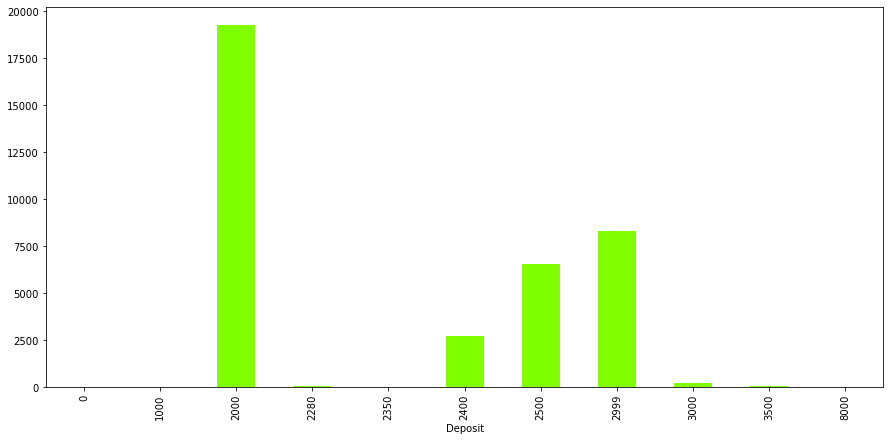

In [324]:
# visualization of grouping and counting deposit column
fig, ax = plt.subplots(figsize=(15, 7))
deposit.plot.bar(color= "Chartreuse")

## UPSELL DATE AND ACCESORY DATE

In [325]:
# grouping and counting values
access = paygo.groupby("AccessoryRate")["ID"].count().sort_values(ascending= False)
access

AccessoryRate
0.0      36435
40.0       749
80.0       106
44.0        13
120.0       11
35.0         8
20.0         5
70.0         3
75.0         2
88.0         2
105.0        2
30.0         1
10.0         1
132.0        1
160.0        1
195.0        1
200.0        1
240.0        1
Name: ID, dtype: int64

36435
908


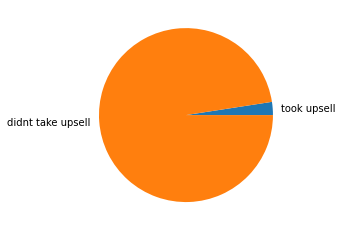

In [326]:
# counting people who took upsells and those who didnt
not_upsell = len(paygo["AccessoryRate"].loc[paygo["AccessoryRate"] == 0])
print(not_upsell)
upsell = len(paygo["AccessoryRate"].loc[paygo["AccessoryRate"] != 0])
print(upsell)
listin = [upsell, not_upsell]
mylabels = ["took upsell", "didnt take upsell"]
plt.pie(listin, labels= mylabels)
plt.show()

# REGISTRATION, EXPECTED TERM, FIRST PAYMENT AND LAST PAYMENT DATE

In [327]:
# convert datatype from object to datetime
paygo["RegistrationDate"] = pd.to_datetime(paygo["RegistrationDate"])
paygo.dtypes

ID                             object
RegistrationDate       datetime64[ns]
Deposit                         int64
UpsellDate                     object
AccessoryRate                 float64
PaymentMethod                  object
rateTypeEntity                 object
RatePerUnit                     int64
DaysOnDeposit                   int64
MainApplicantGender            object
Age                           float64
Region                         object
Town                           object
Occupation                     object
SupplierName                   object
Term                            int64
TotalContractValue            float64
ExpectedTermDate               object
FirstPaymentDate               object
LastPaymentDate                object
dtype: object

In [328]:
paygo["RegistrationDate"].head(10)

0   2015-12-10
1   2015-12-09
2   2015-12-18
3   2015-11-25
4   2015-12-02
5   2015-12-14
6   2015-12-10
7   2015-12-11
8   2015-12-06
9   2015-12-05
Name: RegistrationDate, dtype: datetime64[ns]

In [329]:
# split registrationdate column into register_day,register_month, register_year
paygo["register_day"] = paygo["RegistrationDate"].dt.day
paygo["register_month"] = paygo["RegistrationDate"].dt.month
paygo["register_year"] = paygo["RegistrationDate"].dt.year
print("Registration month of the first id: ", str(paygo["register_month"][0]))
paygo["register_year"].head(10)

Registration month of the first id:  12


0    2015
1    2015
2    2015
3    2015
4    2015
5    2015
6    2015
7    2015
8    2015
9    2015
Name: register_year, dtype: int64

In [330]:
# deleting the registrationdate column
paygo.drop(["RegistrationDate"], axis= 1,inplace= True)

In [331]:
# sorting according to the day with the most registration
most_day = paygo.groupby("register_day")["ID"].count().sort_values(ascending= False)
most_day

register_day
6     1440
7     1403
18    1374
10    1352
12    1347
20    1342
27    1328
14    1327
17    1316
13    1265
16    1257
30    1253
5     1213
19    1212
15    1211
9     1211
28    1209
24    1198
8     1194
21    1192
26    1192
23    1174
11    1170
29    1122
25    1117
22    1062
4     1054
3     1005
31    1001
1      950
2      852
Name: ID, dtype: int64

In [332]:
# sorting according to the month with the most registration
most_month = paygo.groupby("register_month")["ID"].count().sort_values(ascending= False)
most_month

register_month
1     8037
2     6837
4     5299
3     4693
7     4034
8     3634
9     2081
10    1038
12     875
11     670
5      143
6        2
Name: ID, dtype: int64

In [333]:
# sorting according to the year with the most registration
most_year = paygo.groupby("register_year")["ID"].count().sort_values(ascending= False)
most_year

register_year
2018    16068
2017    12228
2020     8934
2015       96
2016       17
Name: ID, dtype: int64

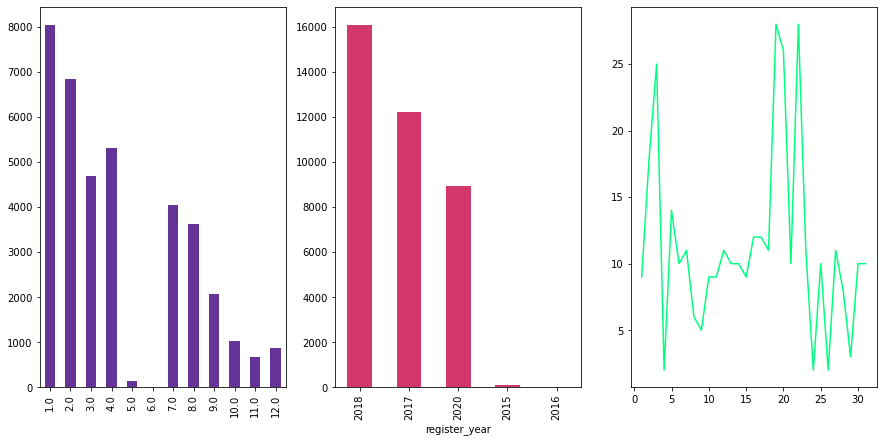

In [334]:
# visuaolization of registration date column
fig, ax = plt.subplots(figsize= (15, 7))
plt.subplot(1, 3, 1)
s = paygo["register_month"].value_counts()
order_mois = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']
s.reindex(np.intersect1d(np.array(order_mois).astype(float), s.index)).plot.bar(color= "RebeccaPurple")
plt.subplot(1, 3, 2)
most_year.plot(kind= "bar", color="#D2386C")
plt.subplot(1, 3, 3)
orders = []
for i in range(1, 32):
    orders.append(str(i))
m = paygo["register_day"]
m.reindex(np.intersect1d(np.array(orders).astype(float), m.index)).plot.line(color="SpringGreen")

## EXPECTEDTERM DATE

In [335]:
paygo.head(10)

,ID,Deposit,UpsellDate,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,...,Occupation,SupplierName,Term,TotalContractValue,ExpectedTermDate,FirstPaymentDate,LastPaymentDate,register_day,register_month,register_year
0,ID_K00S4N4,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,41.0,...,Other,d_light,364,14740.0,2016-12-08 00:00:00,2015-12-10 09:52:35,2016-10-23 04:52:30,10,12,2015
1,ID_6L67PAA,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,33.0,...,Other,d_light,364,14740.0,2016-12-07 00:00:00,2015-12-09 13:14:03,2020-05-24 15:32:18,9,12,2015
2,ID_102CV85,2000,2018-03-29 10:14:58,35.0,FINANCED,DAILY,35,7,Female,48.0,...,Business,d_light,392,29480.0,2017-01-13 00:00:00,2015-12-18 06:22:34,2017-02-01 15:23:44,18,12,2015
3,ID_HXBJFHB,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,43.0,...,Teacher,d_light,364,14740.0,2016-11-23 00:00:00,2015-11-25 13:25:57,2017-05-22 16:46:54,25,11,2015
4,ID_3K9VZ5J,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,56.0,...,Other,d_light,364,14740.0,2016-11-30 00:00:00,2015-12-05 10:34:32,2017-05-12 16:50:52,2,12,2015
5,ID_VJ80SX2,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,NaN,...,Business,d_light,364,14740.0,2016-12-12 00:00:00,2015-12-14 14:20:26,2016-12-12 11:59:20,14,12,2015
6,ID_6YU5YRB,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,56.0,...,Other,d_light,364,14740.0,2016-12-08 00:00:00,2015-12-10 15:15:16,2016-12-11 11:48:01,10,12,2015
7,ID_FK5A5E9,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,41.0,...,Other,d_light,364,14740.0,2016-12-09 00:00:00,2015-12-11 10:34:10,2017-01-08 15:50:18,11,12,2015
8,ID_7OU9HLK,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,32.0,...,Business,d_light,364,14740.0,2016-12-04 00:00:00,2015-12-06 16:41:21,2020-07-22 07:08:17,6,12,2015
9,ID_WVWTPGK,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,42.0,...,Other,d_light,364,14740.0,2016-12-03 00:00:00,2015-12-04 18:11:33,2017-05-17 16:26:08,5,12,2015


In [336]:
# viewing first 10 columns of expectedterm date
paygo["ExpectedTermDate"].head(10)

0    2016-12-08 00:00:00
1    2016-12-07 00:00:00
2    2017-01-13 00:00:00
3    2016-11-23 00:00:00
4    2016-11-30 00:00:00
5    2016-12-12 00:00:00
6    2016-12-08 00:00:00
7    2016-12-09 00:00:00
8    2016-12-04 00:00:00
9    2016-12-03 00:00:00
Name: ExpectedTermDate, dtype: object

In [337]:
# convert datatype from object to datetime
paygo["ExpectedTermDate"] = pd.to_datetime(paygo["ExpectedTermDate"])
paygo.dtypes

ID                             object
Deposit                         int64
UpsellDate                     object
AccessoryRate                 float64
PaymentMethod                  object
rateTypeEntity                 object
RatePerUnit                     int64
DaysOnDeposit                   int64
MainApplicantGender            object
Age                           float64
Region                         object
Town                           object
Occupation                     object
SupplierName                   object
Term                            int64
TotalContractValue            float64
ExpectedTermDate       datetime64[ns]
FirstPaymentDate               object
LastPaymentDate                object
register_day                    int64
register_month                  int64
register_year                   int64
dtype: object

In [338]:
# split registrationdate column into register_day,register_month, register_year
paygo["term_day"] = paygo["ExpectedTermDate"].dt.day
paygo["term_month"] = paygo["ExpectedTermDate"].dt.month
paygo["term_year"] = paygo["ExpectedTermDate"].dt.year
print("Expected term month of the first id: ", str(paygo["term_month"][0]))
paygo["term_year"].head(10)

Expected term month of the first id:  12


0    2016
1    2016
2    2017
3    2016
4    2016
5    2016
6    2016
7    2016
8    2016
9    2016
Name: term_year, dtype: int64

In [339]:
# deleting the registrationdate column
paygo.drop(["ExpectedTermDate"], axis= 1,inplace= True)

In [340]:
# sorting according to the day with the most expected term
expect_day = paygo.groupby("term_day")["ID"].count().sort_values(ascending= False)
expect_day

term_day
7     1557
5     1545
4     1536
6     1519
3     1430
11    1375
8     1337
2     1301
14    1294
13    1283
19    1274
20    1257
17    1246
12    1232
15    1225
10    1217
1     1194
16    1184
9     1180
30    1131
27    1086
18    1076
21    1073
23    1072
24    1051
26    1040
25    1021
28     976
22     973
29     952
31     706
Name: ID, dtype: int64

In [341]:
# sorting according to the month with the most expected term
expect_month = paygo.groupby("term_month")["ID"].count().sort_values(ascending= False)
expect_month

term_month
10    14377
8      7445
7      5442
9      5337
11     2266
12      990
1       680
2       356
3       254
4       126
5        57
6        13
Name: ID, dtype: int64

In [342]:
# sorting according to the year with the most expected term
expect_year = paygo.groupby("term_year")["ID"].count().sort_values(ascending= False)
expect_year

term_year
2019    16042
2018    12155
2020     8857
2017      113
2016       95
2021       81
Name: ID, dtype: int64

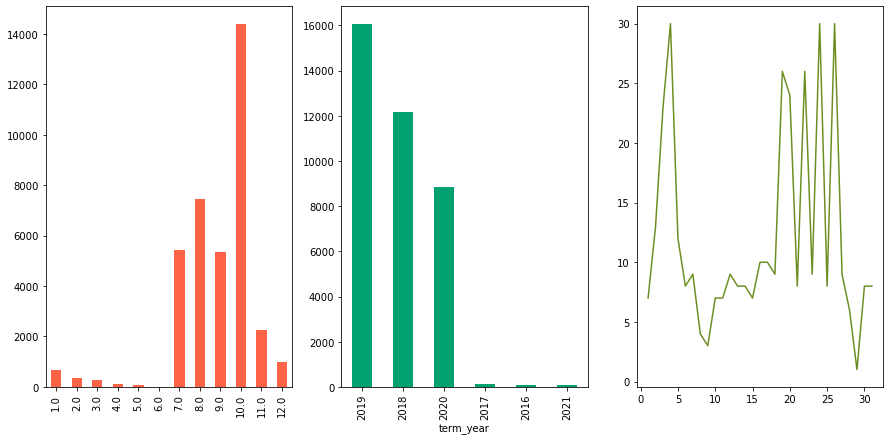

In [343]:
# visuaolization of expectedtermdate date column
fig, ax = plt.subplots(figsize= (15, 7))
plt.subplot(1, 3, 1)
s = paygo["term_month"].value_counts()
order_mois = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']
s.reindex(np.intersect1d(np.array(order_mois).astype(float), s.index)).plot.bar(color= "Tomato")
plt.subplot(1, 3, 2)
expect_year.plot(kind= "bar", color="#00A170")
plt.subplot(1, 3, 3)
orders = []
for i in range(1, 32):
    orders.append(str(i))
m = paygo["term_day"]
m.reindex(np.intersect1d(np.array(orders).astype(float), m.index)).plot.line(color="OliveDrab")

## FIRST PAYMENT DATE

In [344]:
# LOOK AT FIRST PAYMENT DATE
paygo["FirstPaymentDate"].head(10)

0    2015-12-10 09:52:35
1    2015-12-09 13:14:03
2    2015-12-18 06:22:34
3    2015-11-25 13:25:57
4    2015-12-05 10:34:32
5    2015-12-14 14:20:26
6    2015-12-10 15:15:16
7    2015-12-11 10:34:10
8    2015-12-06 16:41:21
9    2015-12-04 18:11:33
Name: FirstPaymentDate, dtype: object

In [345]:
# convert string to datetime datatpes
paygo["FirstPaymentDate"] = pd.to_datetime(paygo["FirstPaymentDate"])

In [346]:
# convert string to datetime datatype
paygo["first_day"] = paygo["FirstPaymentDate"].dt.day
paygo["first_month"] = paygo["FirstPaymentDate"].dt.month
paygo["first_year"] = paygo["FirstPaymentDate"].dt.year
paygo["first_hour"] = paygo["FirstPaymentDate"].dt.hour
paygo["first_hour"].head(10)

0     9
1    13
2     6
3    13
4    10
5    14
6    15
7    10
8    16
9    18
Name: first_hour, dtype: int64

In [347]:
paygo.drop(["FirstPaymentDate"], axis= 1, inplace= True)


In [348]:
# sorting according to the hour with most first payment date 
prem_hour = paygo.groupby("first_hour")["ID"].count()
prem_hour

first_hour
1        2
2        2
3        6
4      501
5      882
6     1502
7     2105
8     2536
9     2921
10    2999
11    3396
12    3626
13    3735
14    3857
15    3707
16    2993
17    2033
18     443
19      73
20      22
21       1
22       1
Name: ID, dtype: int64

In [349]:
# sorting according to the day with the most first paymen date
prem_day = paygo.groupby("first_day")["ID"].count()
prem_day

first_day
1      951
2      852
3     1006
4     1051
5     1214
6     1437
7     1407
8     1191
9     1214
10    1352
11    1173
12    1345
13    1267
14    1326
15    1209
16    1254
17    1318
18    1378
19    1210
20    1343
21    1192
22    1062
23    1175
24    1196
25    1116
26    1192
27    1330
28    1207
29    1125
30    1249
31    1001
Name: ID, dtype: int64

In [350]:
# sorting according to the month with the most first payment date
prem_month = paygo.groupby("first_month")["ID"].count()
prem_month

first_month
1     8037
2     6838
3     4693
4     5300
5      143
6        2
7     4031
8     3636
9     2079
10    1039
11     669
12     876
Name: ID, dtype: int64

In [351]:
# sorting according to the year with the most first payment date
prem_year = paygo.groupby("first_year")["ID"].count().sort_values(ascending= False)
prem_year

first_year
2018    16068
2017    12228
2020     8934
2015       96
2016       17
Name: ID, dtype: int64

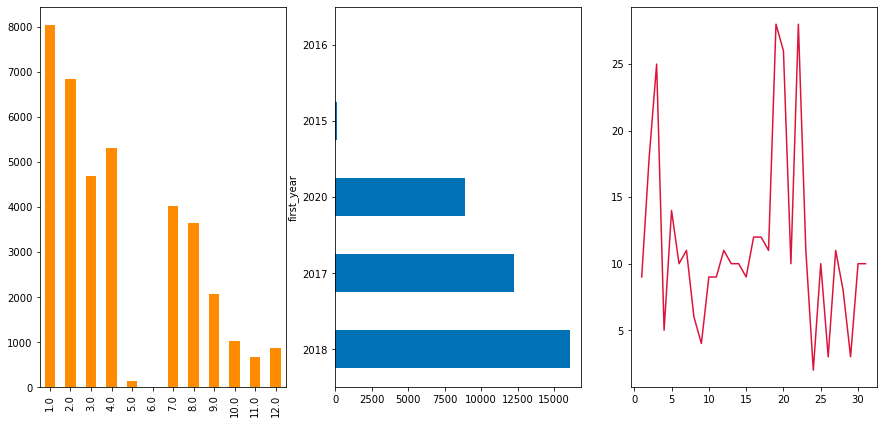

In [352]:
# visuaolization of first payment column
fig, ax = plt.subplots(figsize= (15, 7))
plt.subplot(1, 3, 1)
s = paygo["first_month"].value_counts()
order_mois = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']
s.reindex(np.intersect1d(np.array(order_mois).astype(float), s.index)).plot.bar(color= "DarkOrange")
plt.subplot(1, 3, 2)
prem_year.plot(kind= "barh", color="#0072B5")
plt.subplot(1, 3, 3)
orders = []
for i in range(1, 32):
    orders.append(str(i))
m = paygo["first_day"]
m.reindex(np.intersect1d(np.array(orders).astype(float), m.index)).plot.line(color="Crimson")

In [353]:
# make lists to for columns first_day, first_month, first_year, last_day, last_month, last_year
register_day = list(paygo["register_day"])
register_month = list(paygo["register_month"])
register_year = list(paygo["register_year"])
first_day = list(paygo["first_day"])
first_month = list(paygo["first_month"])
first_year = list(paygo["first_year"])

In [354]:
# true if registration date is equal to first payment date
registereqfirst = []
for rf in range(len(register_day)):
    r_siku = register_day[rf]
    r_mwezi = register_month[rf]
    r_mwaka = register_year[rf]
    f_jour = first_day[rf]
    f_mois = first_month[rf]
    f_annee = first_year[rf]
    if r_siku == f_jour and r_mwezi == f_mois and r_mwaka == f_annee:
        bank = 1
    else:
        bank = 0
    if r_mwezi == f_mois and r_mwaka == f_annee:
        on_it = 1
    else:
        on_it = 0
    registereqfirst.append(bank)

In [355]:
# print registereqmonth
print(registereqfirst)

[1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [356]:
paygo["registereqfirst"] = registereqfirst
derr_hour = paygo.groupby("registereqfirst")["ID"].count()
derr_hour

registereqfirst
0       85
1    37258
Name: ID, dtype: int64

## LASTPAYMENTDATE

In [357]:
paygo["LastPaymentDate"].head(10)

0    2016-10-23 04:52:30
1    2020-05-24 15:32:18
2    2017-02-01 15:23:44
3    2017-05-22 16:46:54
4    2017-05-12 16:50:52
5    2016-12-12 11:59:20
6    2016-12-11 11:48:01
7    2017-01-08 15:50:18
8    2020-07-22 07:08:17
9    2017-05-17 16:26:08
Name: LastPaymentDate, dtype: object

In [358]:
paygo["LastPaymentDate"] = pd.to_datetime(paygo["LastPaymentDate"])

In [359]:
paygo["last_day"] = paygo["LastPaymentDate"].dt.day
paygo["last_month"] = paygo["LastPaymentDate"].dt.month
paygo["last_year"] = paygo["LastPaymentDate"].dt.year
paygo["last_hour"] = paygo["LastPaymentDate"].dt.hour
paygo["last_hour"].head(10)

0     4
1    15
2    15
3    16
4    16
5    11
6    11
7    15
8     7
9    16
Name: last_hour, dtype: int64

In [360]:
# creating lists from concerned columns
prem_jour = list(paygo["first_day"])
prem_mois = list(paygo["first_month"])
prem_annee = list(paygo["first_year"])
derr_jour = list(paygo["last_day"])
derr_mois = list(paygo["last_month"])
derr_annee = list(paygo["last_year"])

In [361]:
# create the variables of specific day, month and year
tofauti_siku = []
for t in range(len(derr_annee)):
    f_jour = prem_jour[t]
    f_mois = prem_mois[t]
    f_annee = prem_annee[t]
    l_jour = derr_jour[t]
    l_mois = derr_mois[t]
    l_annee = derr_annee[t]
    d_jours = l_jour - f_jour
    d_mois = l_mois - f_mois
    d_annee = l_annee - f_annee
    if d_annee > 0:
        d_miezi = d_annee * 12
        d_mois += d_miezi
        if d_mois > 0:
            d_siku = d_mois * 30.5
            d_siku = np.floor(d_siku)
            d_jours += d_siku
            d_mois = 0
    else:
        if d_mois > 0:
            d_siku = d_mois * 30.5
            d_siku = np.floor(d_siku)
            d_jours += d_siku
    tofauti_siku.append(d_jours)  
print(tofauti_siku)

[318.0, 1631.0, 410.0, 546.0, 525.0, 364.0, 367.0, 393.0, 1693.0, 531.0, 371.0, 366.0, 427.0, 1728.0, 409.0, 485.0, 365.0, 1728.0, 363.0, 475.0, 423.0, 410.0, 512.0, 455.0, 1072.0, 367.0, 489.0, 390.0, 702.0, 798.0, 380.0, 407.0, 481.0, 342.0, 354.0, 349.0, 378.0, 1097.0, 443.0, 450.0, 590.0, 469.0, 433.0, 422.0, 511.0, 376.0, 656.0, 378.0, 484.0, 335.0, 357.0, 712.0, 404.0, 376.0, 888.0, 369.0, 1633.0, 368.0, 420.0, 360.0, 342.0, 405.0, 929.0, 375.0, 554.0, 357.0, 370.0, 457.0, 411.0, 708.0, 467.0, 343.0, 334.0, 379.0, 423.0, 420.0, 1740.0, 423.0, 451.0, 382.0, 602.0, 622.0, 647.0, 1132.0, 1149.0, 367.0, 375.0, 1346.0, 354.0, 1148.0, 362.0, 1366.0, 620.0, 335.0, 1708.0, 398.0, 437.0, 339.0, 758.0, 737.0, 403.0, 371.0, 440.0, 1611.0, 900.0, 461.0, 1540.0, 519.0, 730.0, 1387.0, 428.0, 1279.0, 570.0, 467.0, 305.0, 505.0, 419.0, 421.0, 1522.0, 743.0, 789.0, 1516.0, 391.0, 594.0, 543.0, 1369.0, 383.0, 425.0, 446.0, 406.0, 472.0, 578.0, 370.0, 1420.0, 383.0, 592.0, 416.0, 548.0, 366.0, 1295

In [362]:
paygo["tofauti_siku"] = tofauti_siku
paygo.head(10)

,ID,Deposit,UpsellDate,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,...,first_day,first_month,first_year,first_hour,registereqfirst,last_day,last_month,last_year,last_hour,tofauti_siku
0,ID_K00S4N4,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,41.0,...,10,12,2015,9,1,23,10,2016,4,318.0
1,ID_6L67PAA,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,33.0,...,9,12,2015,13,1,24,5,2020,15,1631.0
2,ID_102CV85,2000,2018-03-29 10:14:58,35.0,FINANCED,DAILY,35,7,Female,48.0,...,18,12,2015,6,1,1,2,2017,15,410.0
3,ID_HXBJFHB,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,43.0,...,25,11,2015,13,1,22,5,2017,16,546.0
4,ID_3K9VZ5J,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,56.0,...,5,12,2015,10,0,12,5,2017,16,525.0
5,ID_VJ80SX2,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,NaN,...,14,12,2015,14,1,12,12,2016,11,364.0
6,ID_6YU5YRB,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,56.0,...,10,12,2015,15,1,11,12,2016,11,367.0
7,ID_FK5A5E9,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,41.0,...,11,12,2015,10,1,8,1,2017,15,393.0
8,ID_7OU9HLK,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,32.0,...,6,12,2015,16,1,22,7,2020,7,1693.0
9,ID_WVWTPGK,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,42.0,...,4,12,2015,18,0,17,5,2017,16,531.0


In [363]:
paygo.drop(["LastPaymentDate"], axis= 1, inplace= True)

In [364]:
# sorting according to the hour with the most last payment date
derr_hour = paygo.groupby("last_hour")["ID"].count()
derr_hour

last_hour
0       44
1       55
2      111
3      325
4      791
5     1105
6     1469
7     1360
8     1449
9     1344
10    1453
11    1539
12    1970
13    2350
14    2401
15    3954
16    6377
17    4334
18    2331
19    1042
20    1309
21     121
22      68
23      41
Name: ID, dtype: int64

In [365]:
# sorting according to the day with the most last payment date
derr_day = paygo.groupby("last_day")["ID"].count()
derr_day

last_day
1      968
2     2057
3     1061
4     1070
5     1133
6     1185
7     1029
8     1095
9      985
10    1095
11    1050
12    1130
13    1055
14    1064
15    1194
16    1056
17    1293
18    1126
19    1092
20    1296
21    1225
22    1270
23    1361
24    1629
25    1871
26    2368
27    1028
28     889
29    1313
30     847
31     508
Name: ID, dtype: int64

In [366]:
# sorting according to the month with the most last payment date
derr_month = paygo.groupby("last_month")["ID"].count()
derr_month

last_month
1     2818
2     2662
3     2995
4     2572
5     9502
6      873
7     1300
8     2372
9     3123
10    2226
11    3499
12    3401
Name: ID, dtype: int64

In [367]:
# sorting according to the year with the most last payment date
derr_year = paygo.groupby("last_year")["ID"].count().sort_values(ascending= False)
derr_year

last_year
2021    14814
2020    10707
2019     7352
2018     4383
2017       56
2016       31
Name: ID, dtype: int64

In [368]:
# make first hour and last hour into a list
prem_heure = list(paygo["first_hour"])
derr_heure = list(paygo["last_hour"])


In [369]:
prem_matin =[]
derr_soir = []
for h in range(len(prem_heure)):
    prem = prem_heure[h]
    derr = derr_heure[h]
    if prem < 12:
        mat = 1
    else:
        mat = 0
    if derr > 11:
        soiree = 1
    else:
        soiree = 0
    prem_matin.append(mat)
    derr_soir.append(soiree)
print(prem_matin)

[1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 

In [370]:
print(derr_soir)

[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 

In [371]:
# place into paygo dataframe
paygo["prem_matin"] = prem_matin
paygo["derr_soir"] = derr_soir
paygo.head(10)

,ID,Deposit,UpsellDate,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,...,first_year,first_hour,registereqfirst,last_day,last_month,last_year,last_hour,tofauti_siku,prem_matin,derr_soir
0,ID_K00S4N4,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,41.0,...,2015,9,1,23,10,2016,4,318.0,1,0
1,ID_6L67PAA,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,33.0,...,2015,13,1,24,5,2020,15,1631.0,0,1
2,ID_102CV85,2000,2018-03-29 10:14:58,35.0,FINANCED,DAILY,35,7,Female,48.0,...,2015,6,1,1,2,2017,15,410.0,1,1
3,ID_HXBJFHB,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,43.0,...,2015,13,1,22,5,2017,16,546.0,0,1
4,ID_3K9VZ5J,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,56.0,...,2015,10,0,12,5,2017,16,525.0,1,1
5,ID_VJ80SX2,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,NaN,...,2015,14,1,12,12,2016,11,364.0,0,0
6,ID_6YU5YRB,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,56.0,...,2015,15,1,11,12,2016,11,367.0,0,0
7,ID_FK5A5E9,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,41.0,...,2015,10,1,8,1,2017,15,393.0,1,1
8,ID_7OU9HLK,2000,NaN,0.0,FINANCED,DAILY,35,7,Male,32.0,...,2015,16,1,22,7,2020,7,1693.0,0,0
9,ID_WVWTPGK,2000,NaN,0.0,FINANCED,DAILY,35,7,Female,42.0,...,2015,18,0,17,5,2017,16,531.0,0,1


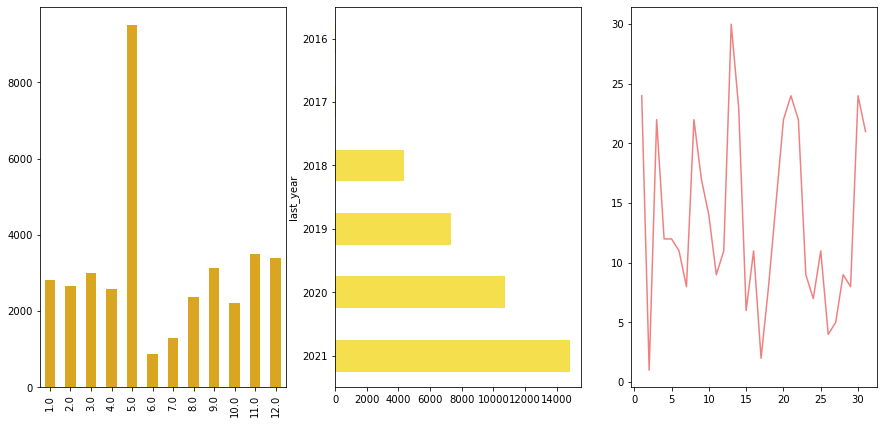

In [372]:
# visuaolization of first payment date column
fig, ax = plt.subplots(figsize= (15, 7))
plt.subplot(1, 3, 1)
s = paygo["last_month"].value_counts()
order_mois = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']
s.reindex(np.intersect1d(np.array(order_mois).astype(float), s.index)).plot.bar(color= "GoldenRod")
plt.subplot(1, 3, 2)
derr_year.plot(kind= "barh", color="#F5DF4D")
plt.subplot(1, 3, 3)
orders = []
for i in range(1, 32):
    orders.append(str(i))
m = paygo["last_day"]
m.reindex(np.intersect1d(np.array(orders).astype(float), m.index)).plot.line(color="LightCoral")

## UPSELL DATE

In [373]:
paygo["UpsellDate"].head(10)

0                    NaN
1                    NaN
2    2018-03-29 10:14:58
3                    NaN
4                    NaN
5                    NaN
6                    NaN
7                    NaN
8                    NaN
9                    NaN
Name: UpsellDate, dtype: object

In [374]:
paygo["UpsellDate"] = pd.to_datetime(paygo["UpsellDate"])

In [375]:
paygo["upsell_day"] = paygo["UpsellDate"].dt.day
paygo["upsell_month"] = paygo["UpsellDate"].dt.month
paygo["upsell_year"] = paygo["UpsellDate"].dt.year
paygo["upsell_hour"] = paygo["UpsellDate"].dt.hour

In [376]:
# create a new column upsell_taken
paygo["upsell_taken"] =  1
paygo["upsell_taken"].loc[paygo["UpsellDate"].isna()] = 0
paygo.groupby("upsell_taken")["ID"].count().sort_values(ascending= False)

upsell_taken
0    36370
1      973
Name: ID, dtype: int64

In [377]:
# filling in missing values of child columns of upselldate column
paygo["upsell_day"].fillna(0, inplace= True)
paygo["upsell_month"].fillna(0, inplace= True)
paygo["upsell_year"].fillna(0, inplace= True)
paygo["upsell_hour"].fillna(24, inplace= True)
print(paygo["upsell_day"].isna().any())
print(paygo["upsell_month"].isna().any())
print(paygo["upsell_year"].isna().any())
print(paygo["upsell_hour"].isna().any())

False
False
False
False


In [378]:
paygo.drop(["UpsellDate"], axis=1, inplace= True)


In [379]:
# sorting according to the hour with the most upsell date
upcel_heure = paygo.groupby("upsell_hour")["ID"].count()
upcel_heure

upsell_hour
0.0       891
4.0         1
5.0         3
6.0         3
7.0         5
8.0         9
9.0         5
10.0        8
11.0        3
12.0       10
13.0       20
14.0        3
15.0        4
16.0        1
17.0        2
18.0        4
19.0        1
24.0    36370
Name: ID, dtype: int64

In [380]:
# sorting according to the day with the most upsell date
upcel_day = paygo.groupby("upsell_day")["ID"].count()
upcel_day

upsell_day
0.0     36370
1.0        16
2.0        17
3.0        20
4.0        17
5.0        27
6.0        27
7.0        22
8.0        25
9.0        34
10.0       20
11.0       25
12.0       35
13.0       26
14.0       28
15.0       16
16.0       44
17.0       28
18.0       24
19.0       42
20.0       42
21.0       23
22.0       30
23.0       51
24.0       46
25.0       28
26.0       52
27.0       48
28.0       51
29.0       28
30.0       48
31.0       33
Name: ID, dtype: int64

In [381]:
# sorting according to the month with the most upsell date
upcel_month = paygo.groupby("upsell_month")["ID"].count()
upcel_month

upsell_month
0.0     36370
1.0        84
2.0       162
3.0       228
4.0       429
5.0        11
6.0         6
7.0         4
8.0        19
9.0        14
10.0        2
11.0        7
12.0        7
Name: ID, dtype: int64

In [382]:
# sorting according to the year with the most upsell date
upcel_year = paygo.groupby("upsell_year")["ID"].count().sort_values(ascending= False)
upcel_year

upsell_year
0.0       36370
2018.0      916
2019.0       35
2020.0       17
2017.0        4
2021.0        1
Name: ID, dtype: int64

In [383]:
# list of register_day, register_month, register_year, upsell_day, upsell_month and upsell_year
register_day = list(paygo["register_day"])
register_month = list(paygo["register_month"])
register_year = list(paygo["register_year"])
upsell_day = list(paygo["upsell_day"])
upsell_month = list(paygo["upsell_month"])
upsell_year = list(paygo["upsell_year"])


In [384]:
# create the variables of specific day, month and year
timeb4upsell = []
for i in range(len(register_day)):
    r_day = register_day[i]
    r_month = register_month[i]
    r_year = register_year[i]
    u_day = upsell_day[i]
    u_month = upsell_month[i]
    u_year = upsell_year[i]
    if u_day == 0 and u_month == 0 and u_year == 0:
        temps = 0
    else:
        jours = u_day - r_day
        months = u_month - r_month
        years = u_year - r_year
        if years > 0:
            na = years * 12
            months += na
            if months > 0:
                bo = np.floor(months * 30.5)
                jours += bo
                months  = 0
        elif months > 0:
            ming = np.floor(months * 30.5)
            jours += ming
        temps = jours
    timeb4upsell.append(temps)
print(timeb4upsell)

[0, 0, 834.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1114.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1087.0, 0, 0, 0, 569.0, 0, 0, 1354.0, 0, 533.0, 536.0, 0, 0, 0, 510.0, 0, 1072.0, 0, 0, 1026.0, 0, 0, 1018.0, 0, 1023.0, 0, 0, 0, 0, 0, 0, 987.0, 0, 0, 970.0, 0, 0, 0, 1005.0, 0, 482.0, 0, 492.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 415.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 434.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [385]:
# place timeb4upsell to dataframe 
paygo["timeb4upsell"] = timeb4upsell
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,last_hour,tofauti_siku,prem_matin,derr_soir,upsell_day,upsell_month,upsell_year,upsell_hour,upsell_taken,timeb4upsell
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,4,318.0,1,0,0.0,0.0,0.0,24.0,0,0.0
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,15,1631.0,0,1,0.0,0.0,0.0,24.0,0,0.0
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,15,410.0,1,1,29.0,3.0,2018.0,10.0,1,834.0
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,...,16,546.0,0,1,0.0,0.0,0.0,24.0,0,0.0
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,16,525.0,1,1,0.0,0.0,0.0,24.0,0,0.0
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,11,364.0,0,0,0.0,0.0,0.0,24.0,0,0.0
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,11,367.0,0,0,0.0,0.0,0.0,24.0,0,0.0
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,15,393.0,1,1,0.0,0.0,0.0,24.0,0,0.0
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,7,1693.0,0,0,0.0,0.0,0.0,24.0,0,0.0
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,16,531.0,0,1,0.0,0.0,0.0,24.0,0,0.0


## PaymentMethod and rateTypeEntity

In [386]:
pay_met = paygo.groupby("PaymentMethod")["ID"].count().sort_values(ascending= False)
pay_met

PaymentMethod
FINANCED    37343
Name: ID, dtype: int64

In [387]:
rate_entity = paygo.groupby("rateTypeEntity")["ID"].count().sort_values(ascending= False)
rate_entity

rateTypeEntity
DAILY      37168
MONTHLY       97
WEEKLY        78
Name: ID, dtype: int64

([<matplotlib.patches.Wedge at 0x2500392cc70>,
 [Text(-1.0998807896341776, 0.01619409132055159, ''),
  Text(1.0997508441589006, -0.023411124957709063, ''),
  Text(1.099976316852287, -0.007218196733093093, '')])

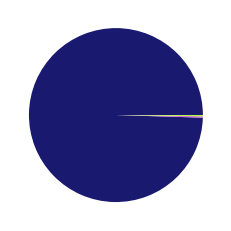

In [388]:
plt.pie(rate_entity, colors= ["MidnightBlue", "Orchid", "GreenYellow"])

In [389]:
# pivot table rateTypeEntity and Term
pivot = paygo.pivot_table(index= ["rateTypeEntity", "Term"], aggfunc= "count")
pivot["ID"]

rateTypeEntity  Term
DAILY           111         1
                128         2
                168         3
                179        36
                195        33
                207         1
                209         1
                211         1
                222         1
                233         3
                240      2736
                245         5
                247         5
                250         5
                251         1
                257         1
                259         2
                270      5839
                276         4
                308        10
                311         2
                320        15
                325         1
                328         1
                340       188
                344         1
                364     13399
                389         7
                392         1
                395         1
                399        95
                403         9
                415

In [390]:
# pivot table of rateTypeEntity and TotalContractValue
peak = paygo.pivot_table(index= ["rateTypeEntity", "TotalContractValue"], aggfunc= "count")
peak["ID"]

rateTypeEntity  TotalContractValue
DAILY           10800.0                   5
                12000.0                  41
                12800.0                5839
                14000.0                   3
                14400.0                2736
                14740.0                  95
                15000.0                   1
                15300.0                  15
                16560.0               13304
                16600.0                 188
                17440.0                   1
                17560.0                   1
                18060.0                   1
                18560.0                   5
                19575.0                  33
                20560.0                   9
                21060.0                   1
                29480.0                   1
                29850.0                   1
                33080.0                6474
                33084.0                7519
                33120.0                  

In [391]:
# day_term
day_term = []
RTE = list(paygo["rateTypeEntity"])
term = list(paygo["Term"])
for i in range(len(term)):
    te = term[i]
    rte = RTE[i]
    if rte == "MONTHLY":
        te = np.floor(te * 30.5)
    elif rte == "WEEKLY":
        te = np.floor(te * 7)
    day_term.append(te)
print(day_term)

[364, 364, 392, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 276, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 276, 364, 364, 364, 389, 364, 364, 222, 364, 395, 389, 364, 364, 364, 389, 364, 128, 364, 364, 247, 364, 364, 311, 364, 247, 364, 364, 364, 364, 364, 364, 207, 364, 364, 247, 364, 364, 364, 168, 364, 259, 364, 259, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 389, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 389, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364,

In [392]:
paygo["day_term"] = day_term

In [393]:
# pivot table of rateTypeEntity and TotalContractValue
peak = paygo.pivot_table(index= ["rateTypeEntity", "day_term"], aggfunc= "count")
peak["ID"]

rateTypeEntity  day_term
DAILY           111.0           1
                128.0           2
                168.0           3
                179.0          36
                195.0          33
                207.0           1
                209.0           1
                211.0           1
                222.0           1
                233.0           3
                240.0        2736
                245.0           5
                247.0           5
                250.0           5
                251.0           1
                257.0           1
                259.0           2
                270.0        5839
                276.0           4
                308.0          10
                311.0           2
                320.0          15
                325.0           1
                328.0           1
                340.0         188
                344.0           1
                364.0       13399
                389.0           7
                392.0  

In [394]:
paygo["Termination"] = paygo["day_term"] - paygo["tofauti_siku"]
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,prem_matin,derr_soir,upsell_day,upsell_month,upsell_year,upsell_hour,upsell_taken,timeb4upsell,day_term,Termination
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,1,0,0.0,0.0,0.0,24.0,0,0.0,364.0,46.0
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,0,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-1267.0
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,1,1,29.0,3.0,2018.0,10.0,1,834.0,392.0,-18.0
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,...,0,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-182.0
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,1,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-161.0
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0,0,0.0,0.0,0.0,24.0,0,0.0,364.0,0.0
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0,0,0.0,0.0,0.0,24.0,0,0.0,364.0,-3.0
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,1,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-29.0
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0,0,0.0,0.0,0.0,24.0,0,0.0,364.0,-1329.0
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,0,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-167.0


## RATEPERUNIT AND DAYSONDEPOSIT

In [395]:
rate_unit = paygo.groupby("RatePerUnit")["ID"].count()
rate_unit

RatePerUnit
35         96
40      19386
50       2744
55      14867
67         36
85         33
90          1
95          5
280        78
1000       95
4000        2
Name: ID, dtype: int64

In [396]:
# create new column RADD. Dividing Deposit by DaysOnDeposit
paygo["RADD"] = paygo["Deposit"].div(paygo.DaysOnDeposit, axis= 0)
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,derr_soir,upsell_day,upsell_month,upsell_year,upsell_hour,upsell_taken,timeb4upsell,day_term,Termination,RADD
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,0,0.0,0.0,0.0,24.0,0,0.0,364.0,46.0,285.714286
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-1267.0,285.714286
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,1,29.0,3.0,2018.0,10.0,1,834.0,392.0,-18.0,285.714286
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,...,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-182.0,285.714286
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-161.0,285.714286
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0,0.0,0.0,0.0,24.0,0,0.0,364.0,0.0,285.714286
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0,0.0,0.0,0.0,24.0,0,0.0,364.0,-3.0,285.714286
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-29.0,285.714286
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0,0.0,0.0,0.0,24.0,0,0.0,364.0,-1329.0,285.714286
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,1,0.0,0.0,0.0,24.0,0,0.0,364.0,-167.0,285.714286


In [397]:
monkey = paygo.loc[paygo["rateTypeEntity"] == 2000]
print(len(monkey))

0


In [398]:
depos = paygo.groupby(["Deposit", "DaysOnDeposit"])["ID"].count().sort_values(ascending= False)
depos

Deposit  DaysOnDeposit
2000     7                13433
2999     3                 8337
2500     3                 6545
2000     3                 5845
2400     3                 2736
3000     3                  221
3500     60                  95
2280     10                  78
0        0                   36
1000     7                    5
2500     7                    4
2000     14                   3
2350     7                    3
8000     60                   2
Name: ID, dtype: int64

In [399]:
paygo["plus_a_trois"] = 0
paygo["plus_a_trois"].loc[(paygo["Deposit"] == 2000) & (paygo["DaysOnDeposit"] == 7)] = 1


In [400]:
plus = paygo.groupby("plus_a_trois")["ID"].count().sort_values(ascending= False)
plus

plus_a_trois
0    23910
1    13433
Name: ID, dtype: int64

In [401]:
# groupby and count column RADD
rad= paygo.groupby("RADD")["ID"].count().sort_values(ascending= False)
rad

RADD
285.714286     13433
999.666667      8337
833.333333      6545
666.666667      5845
800.000000      2736
1000.000000      221
58.333333         95
228.000000        78
142.857143         8
357.142857         4
335.714286         3
133.333333         2
Name: ID, dtype: int64

In [402]:
paygo.loc[paygo["RatePerUnit"] == 4000]

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,upsell_day,upsell_month,upsell_year,upsell_hour,upsell_taken,timeb4upsell,day_term,Termination,RADD,plus_a_trois
16053,ID_NVXN7JY,8000,0.0,FINANCED,MONTHLY,4000,60,Male,60.0,South Rift,...,0.0,0.0,0.0,24.0,0,0.0,305.0,-24.0,133.333333,0
22359,ID_X4LZTMG,8000,0.0,FINANCED,MONTHLY,4000,60,Male,52.0,Nairobi Region,...,0.0,0.0,0.0,24.0,0,0.0,305.0,-39.0,133.333333,0


In [403]:
day_deposit = paygo.groupby("DaysOnDeposit")["ID"].count()
day_deposit

DaysOnDeposit
0        36
3     23684
7     13445
10       78
14        3
60       97
Name: ID, dtype: int64

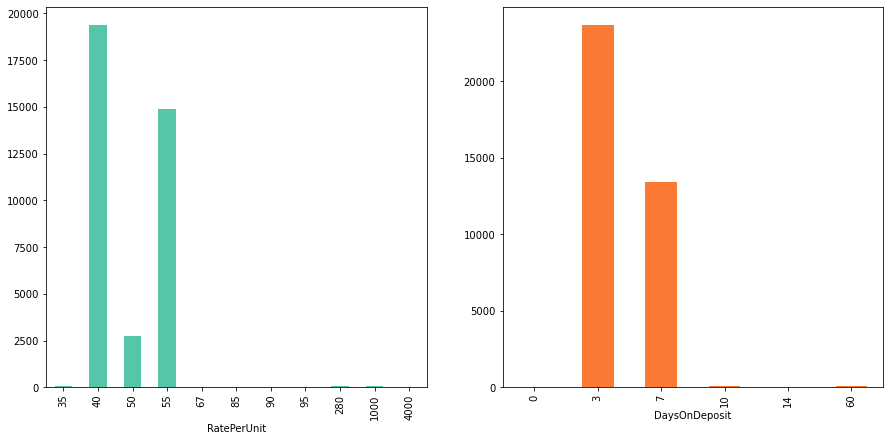

In [404]:
# visualization of rate per unit and days on deposit column
fig, ax = plt.subplots(figsize=(15, 7))
plt.subplot(1, 2, 1)
rate_unit.plot(kind= "bar", color= "#56C6A9")
plt.subplot(1, 2, 2)
day_deposit.plot(kind= "bar", color= "#FA7A35")
plt.show()

In [405]:
# looking at rate per unit outliers
paygo.loc[paygo["DaysOnDeposit"] == 14]


,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,upsell_day,upsell_month,upsell_year,upsell_hour,upsell_taken,timeb4upsell,day_term,Termination,RADD,plus_a_trois
118,ID_M0OORNB,2000,40.0,FINANCED,DAILY,40,14,Male,39.0,NaN,...,28.0,8.0,2019.0,12.0,1,987.0,207.0,-1315.0,142.857143,0
121,ID_BB8IC59,2000,35.0,FINANCED,DAILY,40,14,Female,45.0,Western,...,17.0,8.0,2019.0,7.0,1,970.0,247.0,-1269.0,142.857143,0
150,ID_Q2KJCXE,2000,40.0,FINANCED,DAILY,40,14,Male,28.0,North Rift,...,17.0,3.0,2018.0,8.0,1,415.0,389.0,-26.0,142.857143,0


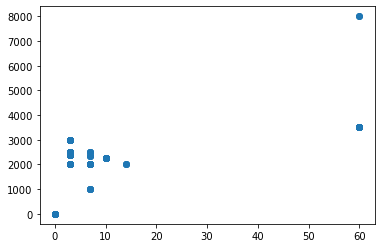

In [406]:
# scatter plot of deposit and daysondeposit
plt.scatter(paygo["DaysOnDeposit"], paygo["Deposit"])
plt.show()

In [407]:
# make lists of column rateTypeEntity and ratePerUnit
kuungana = []
entity = list(paygo["rateTypeEntity"])
unit = list(paygo["RatePerUnit"])
for e in range(len(entity)):
    typing = entity[e]
    unaitas = unit[e]
    if typing == "WEEKLY":
        unaitas = unaitas / 7
        #print("weekly " + str(e))
        #print(unaitas)
    elif typing == "MONTHLY":
        unaitas = unaitas / 30.5
        #print("month " + str(e))
        #print(unaitas)
    kuungana.append(unaitas)
paygo["rate_daily"] = kuungana
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,upsell_month,upsell_year,upsell_hour,upsell_taken,timeb4upsell,day_term,Termination,RADD,plus_a_trois,rate_daily
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,46.0,285.714286,1,35.0
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,0.0,0.0,24.0,0,0.0,364.0,-1267.0,285.714286,1,35.0
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,3.0,2018.0,10.0,1,834.0,392.0,-18.0,285.714286,1,35.0
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,...,0.0,0.0,24.0,0,0.0,364.0,-182.0,285.714286,1,35.0
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,-161.0,285.714286,1,35.0
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,0.0,285.714286,1,35.0
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,-3.0,285.714286,1,35.0
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,-29.0,285.714286,1,35.0
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,-1329.0,285.714286,1,35.0
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,0.0,0.0,24.0,0,0.0,364.0,-167.0,285.714286,1,35.0


In [408]:
gender = paygo.groupby("rate_daily")["ID"].count().sort_values(ascending= False)
gender

rate_daily
40.000000     19464
55.000000     14867
50.000000      2744
35.000000        96
32.786885        95
67.000000        36
85.000000        33
95.000000         5
131.147541        2
90.000000         1
Name: ID, dtype: int64

In [409]:
# creating new column
most = []
entity = list(paygo["rateTypeEntity"])
unit = list(paygo["RatePerUnit"])
depot = list(paygo["Deposit"])
for y in range(len(depot)):
    ent = entity[y]
    un = unit[y]
    dep = depot[y]
    if dep == 2000 and un == 40 and ent == "DAILY":
        moi = 1
    else:
        moi = 0
    most.append(moi)
paygo["most"] = most
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,upsell_year,upsell_hour,upsell_taken,timeb4upsell,day_term,Termination,RADD,plus_a_trois,rate_daily,most
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,46.0,285.714286,1,35.0,0
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,0.0,24.0,0,0.0,364.0,-1267.0,285.714286,1,35.0,0
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,2018.0,10.0,1,834.0,392.0,-18.0,285.714286,1,35.0,0
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,...,0.0,24.0,0,0.0,364.0,-182.0,285.714286,1,35.0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,-161.0,285.714286,1,35.0,0
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,0.0,285.714286,1,35.0,0
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,-3.0,285.714286,1,35.0,0
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,-29.0,285.714286,1,35.0,0
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,-1329.0,285.714286,1,35.0,0
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,0.0,24.0,0,0.0,364.0,-167.0,285.714286,1,35.0,0


In [410]:
# groupby and count most column
most = paygo.groupby("most")["ID"].count().sort_values(ascending= False)
most

most
1    19175
0    18168
Name: ID, dtype: int64

## MAINAPPLICANTGENDER AND AGE

In [411]:
gender = paygo.groupby("MainApplicantGender")["ID"].count().sort_values(ascending= False)
gender

MainApplicantGender
Male      23351
Female    13992
Name: ID, dtype: int64

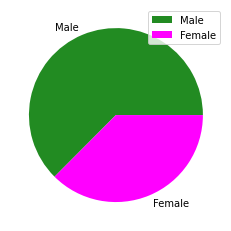

In [412]:
labels = ["Male", "Female"]
plt.pie(gender, colors= ["ForestGreen", "Fuchsia"], labels= labels)
plt.legend()

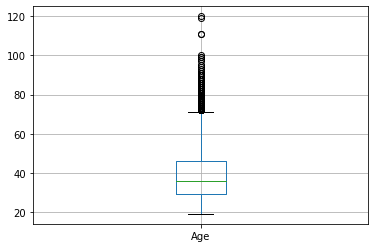

In [413]:
paygo.boxplot(column= "Age")

In [414]:
quel_age = paygo.groupby("Age")["ID"].count().sort_values(ascending= False)
quel_age

Age
34.0     1283
32.0     1263
33.0     1226
27.0     1124
28.0     1113
         ... 
98.0        1
97.0        1
94.0        1
92.0        1
120.0       1
Name: ID, Length: 83, dtype: int64

In [415]:
paygo["Age"].isna().sum()

6939

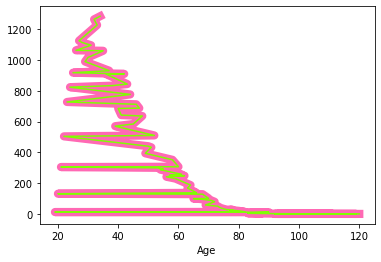

In [416]:
quel_age.plot(kind="line", color="HotPink", linewidth= "8.2")
quel_age.plot(kind="line", color="Chartreuse")

In [417]:
# list of age column
agee = list(paygo["Age"])

In [418]:
# grouping ages according to life cycle
quel_age = []
for a in range(len(agee)):
    quel = agee[a]
    if quel < 35:
        mark = "youth"
    elif quel > 34 and quel < 45:
        mark = "mid age"
    elif quel > 44 and quel < 55:
        mark = "mid life"
    elif quel > 54 and quel < 70:
        mark = "retiring"
    elif quel > 69:
        mark = "extra time"
    else:
        mark = "no_age"
    quel_age.append(mark)
print(quel_age)


['mid age', 'youth', 'mid life', 'mid age', 'retiring', 'no_age', 'retiring', 'mid age', 'youth', 'mid age', 'mid age', 'retiring', 'mid age', 'mid age', 'youth', 'retiring', 'mid life', 'mid age', 'retiring', 'youth', 'mid life', 'youth', 'mid life', 'mid age', 'mid life', 'mid life', 'retiring', 'mid age', 'mid life', 'retiring', 'youth', 'retiring', 'retiring', 'youth', 'youth', 'mid life', 'mid life', 'youth', 'youth', 'retiring', 'youth', 'youth', 'no_age', 'mid life', 'mid life', 'mid life', 'youth', 'mid age', 'no_age', 'retiring', 'mid age', 'mid age', 'youth', 'retiring', 'mid life', 'retiring', 'youth', 'retiring', 'mid life', 'extra time', 'mid age', 'retiring', 'mid life', 'mid age', 'youth', 'mid age', 'mid life', 'extra time', 'mid age', 'retiring', 'mid life', 'retiring', 'youth', 'mid age', 'retiring', 'mid age', 'retiring', 'youth', 'mid age', 'youth', 'youth', 'mid life', 'mid life', 'mid life', 'mid life', 'mid age', 'no_age', 'mid age', 'mid life', 'mid life', 'mid 

In [419]:
# make quel age into a column and count()
paygo["quel_age"] = quel_age
age = paygo.groupby("quel_age")["ID"].count().sort_values(ascending= False)
age

quel_age
youth         13592
mid age        8155
no_age         6939
mid life       4984
retiring       3061
extra time      612
Name: ID, dtype: int64

In [420]:
# one hot encode quel_age column
hot = pd.get_dummies(paygo["quel_age"])
paygo = pd.concat([paygo, hot], axis= 1)
paygo.drop(["quel_age"], axis= 1, inplace= True)
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,RADD,plus_a_trois,rate_daily,most,extra time,mid age,mid life,no_age,retiring,youth
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,285.714286,1,35.0,0,0,1,0,0,0,0
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,285.714286,1,35.0,0,0,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,285.714286,1,35.0,0,0,0,1,0,0,0
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,NaN,...,285.714286,1,35.0,0,0,1,0,0,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,285.714286,1,35.0,0,0,0,0,0,1,0
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,285.714286,1,35.0,0,0,0,0,1,0,0
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,285.714286,1,35.0,0,0,0,0,0,1,0
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,285.714286,1,35.0,0,0,1,0,0,0,0
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,285.714286,1,35.0,0,0,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,285.714286,1,35.0,0,0,1,0,0,0,0


## REGION AND OCCUPATION

In [421]:
#COUNT of region
region = paygo.groupby("Region")["ID"].count().sort_values(ascending= False)
region

Region
Nyanza                6998
North Rift            5344
Nairobi Region        5056
South Rift            4759
Coast Region          4671
Western               4508
Mount Kenya Region    4073
Name: ID, dtype: int64

In [422]:
# HANDLING MISSING VALUES OF REGION COLUMN
paygo["Region"].fillna("Non Region", inplace= True)
print(paygo["Region"].isna().any())

False


In [423]:
# count of town
ville = paygo.groupby("Town")["ID"].count().sort_values(ascending= False)
print(len(ville))

48


In [424]:
# count of occupation
job = paygo.groupby("Occupation")["ID"].count().sort_values(ascending= False)
job

Occupation
Business                  12380
Farmer                    11747
Labourer                   5228
Other                      2770
Driver/Motorbike Rider     2384
Teacher                    1830
Government Employee        1004
Name: ID, dtype: int64

In [425]:
# visualization of town column pivot table
pivot = paygo.pivot_table(index=["Region", "Town"], aggfunc="count")
pivot["ID"]

Region              Town           
Coast Region        Kilifi             2098
                    Kwale              1245
                    Lamu                246
                    Mombasa             309
                    Taita/Taveta        508
                    Tana River          265
Mount Kenya Region  Embu                870
                    Garissa              78
                    Isiolo               48
                    Kirinyaga           158
                    Laikipia            363
                    Mandera              56
                    Marsabit            102
                    Meru               1656
                    Muranga             224
                    Nyeri                88
                    Samburu              72
                    Tharaka-Nithi       291
                    Wajir                67
Nairobi Region      Kajiado             880
                    Kiambu              163
                    Kitui               

In [426]:
# make a list of paygo town
urban = []
villes = list(paygo["Town"])
for i in villes:
    if i == "Mombasa" or i == "Nairobi City" or i == "Kisumu" or i == "Machakos" or i == "Kiambu" or i == "Uasin Gishu" or i == "Nakuru" or i == "Kajiado" or i == "Kilifi":
        downtown = 1
    else:
        downtown = 0
    urban.append(downtown)
print(urban)

[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 

In [427]:
paygo["urban"] = urban
urb = paygo.groupby("urban")["ID"].count().sort_values(ascending= False)
urb

urban
0    27838
1     9505
Name: ID, dtype: int64

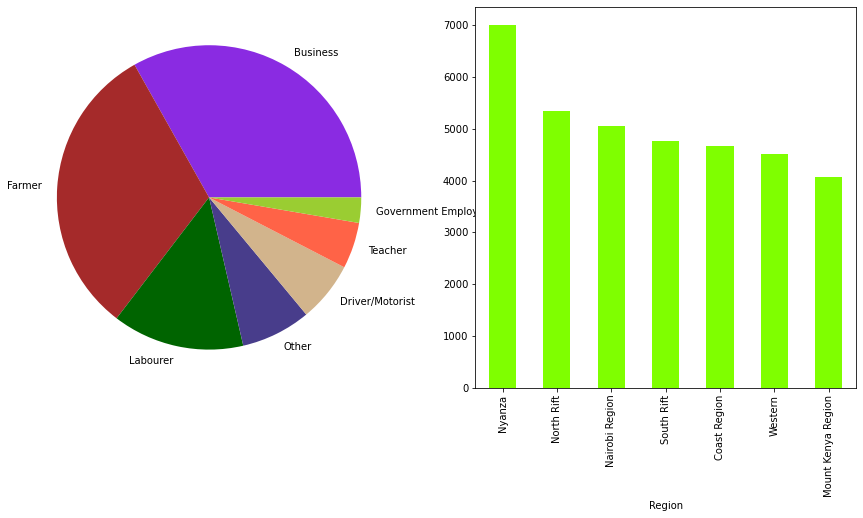

In [428]:
fig, ax = plt.subplots(figsize=(15, 7))
plt.subplot(1, 2, 1)
coluer = ["BlueViolet", "Brown", "DarkGreen", "DarkSlateBlue", "Tan", "Tomato", "YellowGreen"]
labels = ["Business", "Farmer", "Labourer", "Other", "Driver/Motorist", "Teacher", "Government Employee"]
plt.pie(job, colors= coluer, labels= labels)
plt.subplot(1, 2, 2)
region.plot(kind= "bar", color= "Chartreuse")
plt.show()

In [429]:
# separate occupation into blue collar and white collar
blue = []
kazi = list(paygo["Occupation"])
for k in kazi:
    if k == "Business" or k == "Government Employee" or k == "Teacher":
        wera = 0
    else:
        wera = 1
    blue.append(wera)
print(blue)

[1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 

In [430]:
paygo["blue_collar"] = blue
supply = paygo.groupby("blue_collar")["ID"].count().sort_values(ascending= False)
supply

blue_collar
1    22129
0    15214
Name: ID, dtype: int64

## SUPPLIER NAME, TERM AND TOTAL CONTRACT VALUE


In [431]:
supply = paygo.groupby("SupplierName")["ID"].count().sort_values(ascending= False)
supply


SupplierName
d_light    37343
Name: ID, dtype: int64

In [432]:
tems = paygo.groupby("Term")["ID"].count().sort_values(ascending= False)
tems

Term
364    13399
547     7521
556     6474
270     5839
240     2736
568      692
340      188
399       95
12        95
37        78
573       45
179       36
195       33
320       15
308       10
621        9
403        9
389        7
250        5
247        5
578        5
245        5
276        4
233        3
569        3
168        3
429        2
415        2
599        2
10         2
128        2
311        2
259        2
344        1
222        1
111        1
620        1
207        1
209        1
211        1
251        1
392        1
257        1
545        1
325        1
328        1
395        1
626        1
Name: ID, dtype: int64

In [433]:
paygo["Term"].describe()

count    37343.000000
mean       412.427657
std        121.602544
min         10.000000
25%        364.000000
50%        364.000000
75%        547.000000
max        626.000000
Name: Term, dtype: float64

In [434]:
rating = paygo.groupby(["Term", "AccessoryRate"])["ID"].count().sort_values(ascending= False)
rating

Term  AccessoryRate
364   0.0              13399
547   0.0               7521
556   0.0               6474
270   0.0               5839
240   0.0               2736
568   40.0               692
340   0.0                188
399   80.0                95
12    0.0                 95
37    0.0                 78
573   40.0                45
179   0.0                 36
195   0.0                 33
320   0.0                 15
308   120.0               10
621   44.0                 9
403   80.0                 9
389   40.0                 7
247   35.0                 5
250   0.0                  5
245   0.0                  5
578   0.0                  5
276   20.0                 4
569   40.0                 3
233   0.0                  3
168   70.0                 3
259   80.0                 2
599   35.0                 2
429   88.0                 2
128   105.0                2
415   75.0                 2
10    0.0                  2
545   44.0                 1
620   44.0             

In [435]:
contract = paygo.groupby("TotalContractValue")["ID"].count().sort_values(ascending= False)
contract

TotalContractValue
16560.0    13304
33084.0     7519
33080.0     6474
12800.0     5917
14400.0     2736
56964.0      809
16600.0      188
14740.0       95
15500.0       95
56960.0       55
12000.0       41
19575.0       33
15300.0       15
64484.0       12
33120.0       10
20560.0        9
18560.0        5
10800.0        5
53230.0        4
14000.0        3
48000.0        2
29480.0        1
29850.0        1
18060.0        1
17560.0        1
17440.0        1
34120.0        1
21060.0        1
51230.0        1
15000.0        1
64432.0        1
64480.0        1
37084.0        1
Name: ID, dtype: int64

In [436]:
paygo["TotalContractValue"].describe()

count    37343.000000
mean     22953.005142
std      10149.863172
min      10800.000000
25%      16560.000000
50%      16560.000000
75%      33080.000000
max      64484.000000
Name: TotalContractValue, dtype: float64

In [437]:
# column Installments == TotalContractValue - Deposit
paygo["Installments"] = paygo["TotalContractValue"] - paygo["Deposit"]
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,most,extra time,mid age,mid life,no_age,retiring,youth,urban,blue_collar,Installments
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,0,0,1,0,0,0,0,0,1,12740.0
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,0,0,0,0,0,0,1,1,1,12740.0
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,0,0,0,1,0,0,0,0,0,27480.0
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,Non Region,...,0,0,1,0,0,0,0,0,0,12740.0
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,0,0,0,0,0,1,0,0,1,12740.0
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0,0,0,0,1,0,0,0,0,12740.0
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0,0,0,0,0,1,0,0,1,12740.0
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,0,0,1,0,0,0,0,0,1,12740.0
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0,0,0,0,0,0,1,0,0,12740.0
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,0,0,1,0,0,0,0,0,1,12740.0


In [438]:
# make installments into a list
installing = list(paygo["Installments"])
print(installing)

[12740.0, 12740.0, 27480.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 12740.0, 14560.0, 14560.0, 12740.0, 12740.0, 14560.0, 12740.0, 12740.0, 16560.0, 12740.0, 12740.0, 12740.0, 14560.0, 12740.0, 12740.0, 12740.0, 14560.0, 12740.0, 12740.0, 16560.0, 14560.0, 14560.0, 14560.0, 31120.0, 12740.0, 12740.0, 15560.0, 12740.0, 31620.0, 31120.0, 14560.0, 12740.0, 12740.0, 31120.0, 12740.0, 18560.0, 14560.0, 12740.0, 18560.0, 12740.0, 14560.0, 15560.0, 14560.0, 

In [439]:
# groupby and count new column
install = paygo.groupby("Installments")["ID"].count().sort_values(ascending= False)
install

Installments
14560.0    13304
30085.0     7519
30580.0     6474
10800.0     5839
12000.0     2867
53965.0      804
13600.0      188
12740.0       95
10520.0       78
54460.0       55
16575.0       33
12800.0       15
61485.0       12
18560.0       10
31120.0       10
16560.0        5
10000.0        5
54964.0        5
9800.0         5
51230.0        4
11650.0        3
15560.0        2
40000.0        2
61433.0        1
27350.0        1
49230.0        1
34085.0        1
31620.0        1
27480.0        1
15440.0        1
13000.0        1
61980.0        1
Name: ID, dtype: int64

In [440]:
# new column known as contract value per day
paygo["value per day"] = paygo["TotalContractValue"].div(paygo.day_term, axis= 0)
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,extra time,mid age,mid life,no_age,retiring,youth,urban,blue_collar,Installments,value per day
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,0,1,0,0,0,0,0,1,12740.0,40.494505
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,0,0,0,0,0,1,1,1,12740.0,40.494505
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,0,0,1,0,0,0,0,0,27480.0,75.204082
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,Non Region,...,0,1,0,0,0,0,0,0,12740.0,40.494505
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,0,0,0,0,1,0,0,1,12740.0,40.494505
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0,0,0,1,0,0,0,0,12740.0,40.494505
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0,0,0,0,1,0,0,1,12740.0,40.494505
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,0,1,0,0,0,0,0,1,12740.0,40.494505
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0,0,0,0,0,1,0,0,12740.0,40.494505
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,0,1,0,0,0,0,0,1,12740.0,40.494505


In [441]:
contract = paygo.groupby("value per day")["ID"].count().sort_values(ascending= False)
contract

value per day
45.494505     13304
60.482633      7519
59.496403      6474
47.407407      5839
60.000000      2736
100.288732      692
48.823529       188
40.494505        95
142.766917       95
42.349727        95
49.420849        78
99.406632        45
67.039106        36
100.384615       33
47.812500        15
184.948052       10
141.339950        9
103.838969        9
85.141388         7
48.000000         5
44.081633         5
83.238866         5
98.553633         5
67.246377         4
60.085837         3
122.380952        3
93.550088         3
150.312354        2
157.377049        2
95.098497         2
137.262651        2
127.876448        2
254.688995        1
269.971564        1
226.948207        1
160.625000        1
164.531250        1
183.151125        1
196.597561        1
93.656307         1
107.802326        1
104.521101        1
103.922581        1
103.003195        1
89.661836         1
86.379747         1
81.351351         1
75.204082         1
67.859922         1
56.463

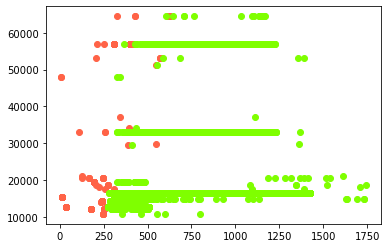

In [442]:
# scatter plot of TotalContractValue against Term and TotalContractValue against tofauti_siku
plt.scatter(paygo["Term"], paygo["TotalContractValue"], color= "Tomato")
plt.scatter(paygo["tofauti_siku"], paygo["TotalContractValue"], color= "Chartreuse")
plt.show()

In [443]:
#divide Total Contract Value by tofauti siku
paygo["Vraival_jour"] = paygo["TotalContractValue"].div(paygo.tofauti_siku, axis= 0)
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,rateTypeEntity,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,...,mid age,mid life,no_age,retiring,youth,urban,blue_collar,Installments,value per day,Vraival_jour
0,ID_K00S4N4,2000,0.0,FINANCED,DAILY,35,7,Male,41.0,Mount Kenya Region,...,1,0,0,0,0,0,1,12740.0,40.494505,46.352201
1,ID_6L67PAA,2000,0.0,FINANCED,DAILY,35,7,Male,33.0,Coast Region,...,0,0,0,0,1,1,1,12740.0,40.494505,9.037400
2,ID_102CV85,2000,35.0,FINANCED,DAILY,35,7,Female,48.0,Nairobi Region,...,0,1,0,0,0,0,0,27480.0,75.204082,71.902439
3,ID_HXBJFHB,2000,0.0,FINANCED,DAILY,35,7,Female,43.0,Non Region,...,1,0,0,0,0,0,0,12740.0,40.494505,26.996337
4,ID_3K9VZ5J,2000,0.0,FINANCED,DAILY,35,7,Female,56.0,Mount Kenya Region,...,0,0,0,1,0,0,1,12740.0,40.494505,28.076190
5,ID_VJ80SX2,2000,0.0,FINANCED,DAILY,35,7,Female,NaN,Mount Kenya Region,...,0,0,1,0,0,0,0,12740.0,40.494505,40.494505
6,ID_6YU5YRB,2000,0.0,FINANCED,DAILY,35,7,Male,56.0,Mount Kenya Region,...,0,0,0,1,0,0,1,12740.0,40.494505,40.163488
7,ID_FK5A5E9,2000,0.0,FINANCED,DAILY,35,7,Female,41.0,Mount Kenya Region,...,1,0,0,0,0,0,1,12740.0,40.494505,37.506361
8,ID_7OU9HLK,2000,0.0,FINANCED,DAILY,35,7,Male,32.0,Mount Kenya Region,...,0,0,0,0,1,0,0,12740.0,40.494505,8.706438
9,ID_WVWTPGK,2000,0.0,FINANCED,DAILY,35,7,Female,42.0,Mount Kenya Region,...,1,0,0,0,0,0,1,12740.0,40.494505,27.758945


In [444]:
paygo[["Term", "TotalContractValue"]].loc[paygo["value per day"] == 4800]

,Term,TotalContractValue


MINI DATAFRAME

In [445]:
# make ID to be a list
identify = list(paygo["ID"])
identify

['ID_K00S4N4',
 'ID_6L67PAA',
 'ID_102CV85',
 'ID_HXBJFHB',
 'ID_3K9VZ5J',
 'ID_VJ80SX2',
 'ID_6YU5YRB',
 'ID_FK5A5E9',
 'ID_7OU9HLK',
 'ID_WVWTPGK',
 'ID_EL1XKC7',
 'ID_P0KAW56',
 'ID_04DSDQS',
 'ID_C0PKZEV',
 'ID_JJ4DQI7',
 'ID_4BNXJX1',
 'ID_54TI8RI',
 'ID_AYIBQUP',
 'ID_0QZIIJG',
 'ID_ZGLB2JE',
 'ID_EZLOQUC',
 'ID_PYJTS69',
 'ID_5G8D6U7',
 'ID_TS79MEU',
 'ID_E26B247',
 'ID_6YZEOBD',
 'ID_1CPRZ13',
 'ID_PZYU5OF',
 'ID_C4L5XN2',
 'ID_QP45YTY',
 'ID_7AKUMTZ',
 'ID_JF9LF7T',
 'ID_Y3GK1NV',
 'ID_XMQFBU6',
 'ID_QJ6MPRY',
 'ID_LYRGMNC',
 'ID_22PA8JG',
 'ID_TM3XAXK',
 'ID_I17DTM0',
 'ID_Z9PO3BE',
 'ID_854VJRJ',
 'ID_KC5RZKC',
 'ID_GOW8Q0M',
 'ID_M71FUON',
 'ID_6CW8LBX',
 'ID_N8HTYN3',
 'ID_XAWLQBY',
 'ID_69S2XFP',
 'ID_ZLW8XIB',
 'ID_1BNGN87',
 'ID_X6SHKP1',
 'ID_35MNQL1',
 'ID_OKYJZCA',
 'ID_S3M5O94',
 'ID_DBXI5V3',
 'ID_WY2EQGX',
 'ID_Q3HMVET',
 'ID_PIJQGSN',
 'ID_6NI55NC',
 'ID_DQ0DH6B',
 'ID_O25689X',
 'ID_1BXJWZ2',
 'ID_36O2OB3',
 'ID_RUVTND3',
 'ID_LMJAKJO',
 'ID_9HK8HZH',
 'ID_OGPN1

In [446]:
# creating a list of lists and making it into a dataframe
minilist = [identify, installing, derr_mois, derr_annee]
miniframe = pd.DataFrame(minilist)
miniframe = miniframe.transpose()
miniframe.columns = ["ID", "Installments", "derr_mois", "derr_annee"]


In [447]:
miniframe.head(10)

,ID,Installments,derr_mois,derr_annee
0,ID_K00S4N4,12740.0,10,2016
1,ID_6L67PAA,12740.0,5,2020
2,ID_102CV85,27480.0,2,2017
3,ID_HXBJFHB,12740.0,5,2017
4,ID_3K9VZ5J,12740.0,5,2017
5,ID_VJ80SX2,12740.0,12,2016
6,ID_6YU5YRB,12740.0,12,2016
7,ID_FK5A5E9,12740.0,1,2017
8,ID_7OU9HLK,12740.0,7,2020
9,ID_WVWTPGK,12740.0,5,2017


## ONE HOT ENCODING COLUMNS

In [448]:
hot = pd.get_dummies(paygo["rateTypeEntity"])
paygo = pd.concat([paygo, hot], axis= 1)
paygo.drop(["rateTypeEntity"], axis= 1, inplace= True)
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,MainApplicantGender,Age,Region,Town,...,retiring,youth,urban,blue_collar,Installments,value per day,Vraival_jour,DAILY,MONTHLY,WEEKLY
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,Male,41.0,Mount Kenya Region,Embu,...,0,0,0,1,12740.0,40.494505,46.352201,1,0,0
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,Male,33.0,Coast Region,Kilifi,...,0,1,1,1,12740.0,40.494505,9.037400,1,0,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,Female,48.0,Nairobi Region,Makueni,...,0,0,0,0,27480.0,75.204082,71.902439,1,0,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,Female,43.0,Non Region,UNKNOWN,...,0,0,0,0,12740.0,40.494505,26.996337,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,Female,56.0,Mount Kenya Region,Kirinyaga,...,1,0,0,1,12740.0,40.494505,28.076190,1,0,0
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,Female,NaN,Mount Kenya Region,Embu,...,0,0,0,0,12740.0,40.494505,40.494505,1,0,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,Male,56.0,Mount Kenya Region,Meru,...,1,0,0,1,12740.0,40.494505,40.163488,1,0,0
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,Female,41.0,Mount Kenya Region,Embu,...,0,0,0,1,12740.0,40.494505,37.506361,1,0,0
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,Male,32.0,Mount Kenya Region,Embu,...,0,1,0,0,12740.0,40.494505,8.706438,1,0,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,Female,42.0,Mount Kenya Region,Kirinyaga,...,0,0,0,1,12740.0,40.494505,27.758945,1,0,0


In [449]:
sexing = list(paygo["MainApplicantGender"])
sex = []
for x in sexing:
    if x == "Male":
        ting = 1
    else:
        ting = 0
    sex.append(ting)
paygo["Gender"] = sex
paygo.drop(["MainApplicantGender"], axis= 1, inplace= True)
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,Region,Town,Occupation,...,youth,urban,blue_collar,Installments,value per day,Vraival_jour,DAILY,MONTHLY,WEEKLY,Gender
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,Mount Kenya Region,Embu,Other,...,0,0,1,12740.0,40.494505,46.352201,1,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,Coast Region,Kilifi,Other,...,1,1,1,12740.0,40.494505,9.037400,1,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,Nairobi Region,Makueni,Business,...,0,0,0,27480.0,75.204082,71.902439,1,0,0,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,Non Region,UNKNOWN,Teacher,...,0,0,0,12740.0,40.494505,26.996337,1,0,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,Mount Kenya Region,Kirinyaga,Other,...,0,0,1,12740.0,40.494505,28.076190,1,0,0,0
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,Mount Kenya Region,Embu,Business,...,0,0,0,12740.0,40.494505,40.494505,1,0,0,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,Mount Kenya Region,Meru,Other,...,0,0,1,12740.0,40.494505,40.163488,1,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,Mount Kenya Region,Embu,Other,...,0,0,1,12740.0,40.494505,37.506361,1,0,0,0
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,Mount Kenya Region,Embu,Business,...,1,0,0,12740.0,40.494505,8.706438,1,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,Mount Kenya Region,Kirinyaga,Other,...,0,0,1,12740.0,40.494505,27.758945,1,0,0,0


In [450]:
# BINARY ENCODING
encoder = ce.BinaryEncoder(cols= ["Region"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["Region"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["Region"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,Town,Occupation,SupplierName,...,value per day,Vraival_jour,DAILY,MONTHLY,WEEKLY,Gender,Region_0,Region_1,Region_2,Region_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,Embu,Other,d_light,...,40.494505,46.352201,1,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,Kilifi,Other,d_light,...,40.494505,9.037400,1,0,0,1,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,Makueni,Business,d_light,...,75.204082,71.902439,1,0,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,UNKNOWN,Teacher,d_light,...,40.494505,26.996337,1,0,0,0,0,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,Kirinyaga,Other,d_light,...,40.494505,28.076190,1,0,0,0,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,Embu,Business,d_light,...,40.494505,40.494505,1,0,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,Meru,Other,d_light,...,40.494505,40.163488,1,0,0,1,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,Embu,Other,d_light,...,40.494505,37.506361,1,0,0,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,Embu,Business,d_light,...,40.494505,8.706438,1,0,0,1,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,Kirinyaga,Other,d_light,...,40.494505,27.758945,1,0,0,0,0,0,0,1


In [451]:
# BINARY ENCODING TOWN COLUMN
encoder = ce.BinaryEncoder(cols= ["Town"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["Town"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["Town"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,Occupation,SupplierName,Term,...,Region_1,Region_2,Region_3,Town_0,Town_1,Town_2,Town_3,Town_4,Town_5,Town_6
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,Other,d_light,364,...,0,0,1,0,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,Other,d_light,364,...,0,1,0,0,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,Business,d_light,392,...,0,1,1,0,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,Teacher,d_light,364,...,1,0,0,0,0,0,0,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,Other,d_light,364,...,0,0,1,0,0,0,0,1,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,Business,d_light,364,...,0,0,1,0,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,Other,d_light,364,...,0,0,1,0,0,0,0,1,1,0
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,Other,d_light,364,...,0,0,1,0,0,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,Business,d_light,364,...,0,0,1,0,0,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,Other,d_light,364,...,0,0,1,0,0,0,0,1,0,1


In [452]:
# binary encoding occupation
encoder = ce.BinaryEncoder(cols= ["Occupation"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["Occupation"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["Occupation"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,Town_1,Town_2,Town_3,Town_4,Town_5,Town_6,Occupation_0,Occupation_1,Occupation_2,Occupation_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,0,1,1,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,1,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,1,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,1,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,1,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,1,0,0,0,1


In [453]:
# binary encoding register_day column
encoder = ce.BinaryEncoder(cols= ["register_day"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["register_day"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["register_day"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,Occupation_0,Occupation_1,Occupation_2,Occupation_3,register_day_0,register_day_1,register_day_2,register_day_3,register_day_4,register_day_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,1,0,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,1,1,0,0,0,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,1,0,0,0,0,1,1,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,1,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,1,0,0,0,1,0,0,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,0,1,0,0,1


In [454]:
# binary encoding register_month column
encoder = ce.BinaryEncoder(cols= ["register_month"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["register_month"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["register_month"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,register_day_1,register_day_2,register_day_3,register_day_4,register_day_5,register_month_0,register_month_1,register_month_2,register_month_3,register_month_4
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,1,0,0,0,0,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,1,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,0,1,0,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,1,1,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,1,1,1,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,1,0,0,0,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,1,0,0,1,0,0,0,0,1


In [455]:
# binary encoding register_year column
encoder = ce.BinaryEncoder(cols= ["register_year"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["register_year"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["register_year"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,register_day_5,register_month_0,register_month_1,register_month_2,register_month_3,register_month_4,register_year_0,register_year_1,register_year_2,register_year_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,1,0,0,0,0,1,0,0,0,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1


In [456]:
# binary encoding term_day column
encoder = ce.BinaryEncoder(cols= ["term_day"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["term_day"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["term_day"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,register_year_0,register_year_1,register_year_2,register_year_3,term_day_0,term_day_1,term_day_2,term_day_3,term_day_4,term_day_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,1,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,1,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,1,0,0,1,0,0,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,0,1,0,0,1


In [457]:
# binary encoding term_month column
encoder = ce.BinaryEncoder(cols= ["term_month"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["term_month"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["term_month"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,term_day_1,term_day_2,term_day_3,term_day_4,term_day_5,term_month_0,term_month_1,term_month_2,term_month_3,term_month_4
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,1,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,1,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,0,1,0,0,0,1,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,1,1,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,1,1,1,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,1,0,0,0,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,1,0,0,1,0,0,0,0,1


In [458]:
# binary encoding term_year column
encoder = ce.BinaryEncoder(cols= ["term_year"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["term_year"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["term_year"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,term_day_5,term_month_0,term_month_1,term_month_2,term_month_3,term_month_4,term_year_0,term_year_1,term_year_2,term_year_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,1,0,0,0,1,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,0,1,1,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,1,1,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1


In [459]:
# binary encoding upsell_day column
encoder = ce.BinaryEncoder(cols= ["upsell_day"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["upsell_day"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["upsell_day"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,term_year_0,term_year_1,term_year_2,term_year_3,upsell_day_0,upsell_day_1,upsell_day_2,upsell_day_3,upsell_day_4,upsell_day_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,1,0,0,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1


In [460]:
# binary encoding upsell_hour column
encoder = ce.BinaryEncoder(cols= ["upsell_hour"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["upsell_hour"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["upsell_hour"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,upsell_day_2,upsell_day_3,upsell_day_4,upsell_day_5,upsell_hour_0,upsell_hour_1,upsell_hour_2,upsell_hour_3,upsell_hour_4,upsell_hour_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,1,0,0,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1


In [461]:
# binary encoding upsell_month column
encoder = ce.BinaryEncoder(cols= ["upsell_month"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["upsell_month"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["upsell_month"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,upsell_hour_1,upsell_hour_2,upsell_hour_3,upsell_hour_4,upsell_hour_5,upsell_month_0,upsell_month_1,upsell_month_2,upsell_month_3,upsell_month_4
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,0,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1


In [462]:
# binary encoding upsell_year column
encoder = ce.BinaryEncoder(cols= ["upsell_year"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["upsell_year"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["upsell_year"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,upsell_hour_5,upsell_month_0,upsell_month_1,upsell_month_2,upsell_month_3,upsell_month_4,upsell_year_0,upsell_year_1,upsell_year_2,upsell_year_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,0,1,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1


In [463]:
# binary encoding first_day column
encoder = ce.BinaryEncoder(cols= ["first_day"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["first_day"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["first_day"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,upsell_year_0,upsell_year_1,upsell_year_2,upsell_year_3,first_day_0,first_day_1,first_day_2,first_day_3,first_day_4,first_day_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,1,0,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,1,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,1,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,1,0,0,1,0,0,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,0,1,0,0,1


In [464]:
# binary encoding first_hour column
encoder = ce.BinaryEncoder(cols= ["first_hour"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["first_hour"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["first_hour"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,first_day_2,first_day_3,first_day_4,first_day_5,first_hour_0,first_hour_1,first_hour_2,first_hour_3,first_hour_4,first_hour_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,1,1,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,1,0,0,0,0,0,0,1,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,1,0,1,0,0,0,1,0,0
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,1,1,0,0,0,0,1,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,1,0
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,1,1,1,0,0,0,1,0,0
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,1,0,0,0,0,0,0,1,1,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,1,0,0,1,0,0,1,0,0,0


In [465]:
# binary encoding first_month column
encoder = ce.BinaryEncoder(cols= ["first_month"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["first_month"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["first_month"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,first_hour_1,first_hour_2,first_hour_3,first_hour_4,first_hour_5,first_month_0,first_month_1,first_month_2,first_month_3,first_month_4
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,1,0,0,0,0,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,1,0,1,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,1,1,1,0,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,1,0,0,0,0,0,0,0,1


In [466]:
# binary encoding first_year column
encoder = ce.BinaryEncoder(cols= ["first_year"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["first_year"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["first_year"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,first_hour_5,first_month_0,first_month_1,first_month_2,first_month_3,first_month_4,first_year_0,first_year_1,first_year_2,first_year_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,1,0,0,0,0,1,0,0,0,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,0,0,1,0,0,0,1


In [467]:
# binary encoding last_hour column
encoder = ce.BinaryEncoder(cols= ["last_hour"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["last_hour"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["last_hour"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,first_year_0,first_year_1,first_year_2,first_year_3,last_hour_0,last_hour_1,last_hour_2,last_hour_3,last_hour_4,last_hour_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,0,0,0,0,1,0
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,0
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,1,0,1
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,1


In [468]:
# binary encoding last_day column
encoder = ce.BinaryEncoder(cols= ["last_day"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["last_day"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["last_day"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,last_hour_2,last_hour_3,last_hour_4,last_hour_5,last_day_0,last_day_1,last_day_2,last_day_3,last_day_4,last_day_5
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,1,0,0,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,1,1,0,0,0,1,0,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,1,0,0,0,1,0,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,1,0,0,0,0,0,1,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,1,0,0,0,0,0,1,1,0
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,1,1,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,1,0,1,0,0,0,1,0,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,1,1,0,0,1,0,0,0


In [469]:
# binary encoding last_month column
encoder = ce.BinaryEncoder(cols= ["last_month"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["last_month"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["last_month"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,last_day_1,last_day_2,last_day_3,last_day_4,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,0,0,0,1,1,0,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,0,1,0
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,0,1,0,0,0,1,0
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,0,0,1,0,1,0,0,1,0,0
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,1,1,0,0,0,1,0,0
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,0,0,1,1,1,0,0,1,0,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,1,0,0,0,0,1,1,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,1,0,0,0,0,0,0,1,0


In [470]:
# binary encoding last_year column
encoder = ce.BinaryEncoder(cols= ["last_year"], return_df= True)
bina = pd.DataFrame(encoder.fit_transform(paygo["last_year"]))
paygo = pd.concat([paygo, bina], axis= 1)
paygo.drop(["last_year"], axis= 1, inplace= True)
paygo.head(10)

C:\Users\Admin\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4,last_year_0,last_year_1,last_year_2,last_year_3
0,ID_K00S4N4,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,2000,0.0,FINANCED,35,7,33.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,1,0
2,ID_102CV85,2000,35.0,FINANCED,35,7,48.0,d_light,392,29480.0,...,1,0,0,0,1,1,0,0,1,1
3,ID_HXBJFHB,2000,0.0,FINANCED,35,7,43.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,1,1
4,ID_3K9VZ5J,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,1,0,0,0,1,0,0,0,1,1
5,ID_VJ80SX2,2000,0.0,FINANCED,35,7,NaN,d_light,364,14740.0,...,1,0,0,1,0,0,0,0,0,1
6,ID_6YU5YRB,2000,0.0,FINANCED,35,7,56.0,d_light,364,14740.0,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,2000,0.0,FINANCED,35,7,41.0,d_light,364,14740.0,...,1,0,0,1,0,1,0,0,1,1
8,ID_7OU9HLK,2000,0.0,FINANCED,35,7,32.0,d_light,364,14740.0,...,0,0,0,1,1,0,0,0,1,0
9,ID_WVWTPGK,2000,0.0,FINANCED,35,7,42.0,d_light,364,14740.0,...,0,0,0,0,1,0,0,0,1,1


In [471]:
# Standard Scaling 
num_cols = ["Deposit", "AccessoryRate", "RatePerUnit", "DaysOnDeposit", "Age", "Term", "TotalContractValue", "tofauti_siku", "value per day", "Termination", "Vraival_jour", "RADD", "rate_daily", "Installments", "day_term", "timeb4upsell"]
for i in num_cols:
    scale = StandardScaler().fit(paygo[[i]])
    paygo[i] = scale.transform(paygo[[i]])
    
paygo.head(10)

,ID,Deposit,AccessoryRate,PaymentMethod,RatePerUnit,DaysOnDeposit,Age,SupplierName,Term,TotalContractValue,...,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4,last_year_0,last_year_1,last_year_2,last_year_3
0,ID_K00S4N4,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,0.174326,d_light,-0.398251,-0.809185,...,1,0,0,0,0,1,0,0,0,1
1,ID_6L67PAA,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,-0.476047,d_light,-0.398251,-0.809185,...,0,0,0,0,1,0,0,0,1,0
2,ID_102CV85,-0.834428,4.346160,FINANCED,-0.259548,0.699666,0.743403,d_light,-0.167989,0.643071,...,1,0,0,0,1,1,0,0,1,1
3,ID_HXBJFHB,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,0.336920,d_light,-0.398251,-0.809185,...,0,0,0,0,1,0,0,0,1,1
4,ID_3K9VZ5J,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,1.393777,d_light,-0.398251,-0.809185,...,1,0,0,0,1,0,0,0,1,1
5,ID_VJ80SX2,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,NaN,d_light,-0.398251,-0.809185,...,1,0,0,1,0,0,0,0,0,1
6,ID_6YU5YRB,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,1.393777,d_light,-0.398251,-0.809185,...,0,0,0,1,0,0,0,0,0,1
7,ID_FK5A5E9,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,0.174326,d_light,-0.398251,-0.809185,...,1,0,0,1,0,1,0,0,1,1
8,ID_7OU9HLK,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,-0.557344,d_light,-0.398251,-0.809185,...,0,0,0,1,1,0,0,0,1,0
9,ID_WVWTPGK,-0.834428,-0.145808,FINANCED,-0.259548,0.699666,0.255623,d_light,-0.398251,-0.809185,...,0,0,0,0,1,0,0,0,1,1


In [472]:
identification = paygo["ID"].copy()
paygo.drop(["ID", "SupplierName", "PaymentMethod"], axis= 1, inplace= True)

In [473]:
imputer = KNNImputer(n_neighbors= 3)
paygo = pd.DataFrame(imputer.fit_transform(paygo), columns= paygo.columns)
paygo.head(10)

,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,prem_matin,...,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4,last_year_0,last_year_1,last_year_2,last_year_3
0,-0.834428,-0.145808,-0.259548,0.699666,0.174326,-0.398251,-0.809185,1.0,-1.261480,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,-0.834428,-0.145808,-0.259548,0.699666,-0.476047,-0.398251,-0.809185,1.0,2.797842,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,-0.834428,4.346160,-0.259548,0.699666,0.743403,-0.167989,0.643071,1.0,-0.977049,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0
3,-0.834428,-0.145808,-0.259548,0.699666,0.336920,-0.398251,-0.809185,1.0,-0.556586,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
4,-0.834428,-0.145808,-0.259548,0.699666,1.393777,-0.398251,-0.809185,0.0,-0.621511,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
5,-0.834428,-0.145808,-0.259548,0.699666,0.716304,-0.398251,-0.809185,1.0,-1.119265,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
6,-0.834428,-0.145808,-0.259548,0.699666,1.393777,-0.398251,-0.809185,1.0,-1.109990,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
7,-0.834428,-0.145808,-0.259548,0.699666,0.174326,-0.398251,-0.809185,1.0,-1.029607,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0
8,-0.834428,-0.145808,-0.259548,0.699666,-0.557344,-0.398251,-0.809185,1.0,2.989524,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
9,-0.834428,-0.145808,-0.259548,0.699666,0.255623,-0.398251,-0.809185,0.0,-0.602961,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0


In [474]:
paygo = pd.concat([identification, paygo], axis= 1)
paygo.head(10)

,ID,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,...,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4,last_year_0,last_year_1,last_year_2,last_year_3
0,ID_K00S4N4,-0.834428,-0.145808,-0.259548,0.699666,0.174326,-0.398251,-0.809185,1.0,-1.261480,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,ID_6L67PAA,-0.834428,-0.145808,-0.259548,0.699666,-0.476047,-0.398251,-0.809185,1.0,2.797842,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,ID_102CV85,-0.834428,4.346160,-0.259548,0.699666,0.743403,-0.167989,0.643071,1.0,-0.977049,...,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0
3,ID_HXBJFHB,-0.834428,-0.145808,-0.259548,0.699666,0.336920,-0.398251,-0.809185,1.0,-0.556586,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
4,ID_3K9VZ5J,-0.834428,-0.145808,-0.259548,0.699666,1.393777,-0.398251,-0.809185,0.0,-0.621511,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
5,ID_VJ80SX2,-0.834428,-0.145808,-0.259548,0.699666,0.716304,-0.398251,-0.809185,1.0,-1.119265,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
6,ID_6YU5YRB,-0.834428,-0.145808,-0.259548,0.699666,1.393777,-0.398251,-0.809185,1.0,-1.109990,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
7,ID_FK5A5E9,-0.834428,-0.145808,-0.259548,0.699666,0.174326,-0.398251,-0.809185,1.0,-1.029607,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0
8,ID_7OU9HLK,-0.834428,-0.145808,-0.259548,0.699666,-0.557344,-0.398251,-0.809185,1.0,2.989524,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
9,ID_WVWTPGK,-0.834428,-0.145808,-0.259548,0.699666,0.255623,-0.398251,-0.809185,0.0,-0.602961,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0


# PROCESSING TRAINING.CSV

COMBINED DATASETS FEATURE ENGINEERING

In [475]:
tran = trainer.copy()
tran.head(10)

,ID,TransactionDates,PaymentsHistory,m1,m2,m3,m4,m5,m6,train
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[3600.0, 750.0, 350.0, 65.0, 95.0, 135.0, 85.0...",880.0,930.0,495.0,715.0,220.0,385.0,1
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 11...",660.0,935.0,935.0,825.0,770.0,935.0,1
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...","[2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0]",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0,...",580.0,480.0,800.0,1260.0,1650.0,530.0,1
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2640.0, 910.0, 480.0, 280.0, 200.0, 180.0, 33...",40.0,440.0,460.0,360.0,80.0,330.0,1
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...","[2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...","[2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 5...",40.0,40.0,40.0,40.0,80.0,80.0,1
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...","[4485.0, 1805.0, 2035.0, 1595.0, 930.0, 1815.0...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...","[3270.0, 100.0, 1650.0, 1715.0, 1000.0, 1265.0...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[2800.0, 850.0, 1180.0, 1500.0, 720.0, 1090.0]",680.0,1040.0,860.0,1000.0,680.0,400.0,1


In [476]:
# merge mini dataframe to trainer dataframe
trainer = pd.merge(trainer, miniframe, on= "ID", how= "outer")
trainer.head(10)

,ID,TransactionDates,PaymentsHistory,m1,m2,m3,m4,m5,m6,train,Installments,derr_mois,derr_annee
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[3600.0, 750.0, 350.0, 65.0, 95.0, 135.0, 85.0...",880.0,930.0,495.0,715.0,220.0,385.0,1,30580.0,5,2021
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 11...",660.0,935.0,935.0,825.0,770.0,935.0,1,30580.0,5,2021
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...","[2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0]",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,12000.0,1,2021
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0,...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,14560.0,12,2018
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2640.0, 910.0, 480.0, 280.0, 200.0, 180.0, 33...",40.0,440.0,460.0,360.0,80.0,330.0,1,14560.0,5,2021
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...","[2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,14560.0,9,2018
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...","[2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 5...",40.0,40.0,40.0,40.0,80.0,80.0,1,14560.0,9,2020
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...","[4485.0, 1805.0, 2035.0, 1595.0, 930.0, 1815.0...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,30085.0,9,2019
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...","[3270.0, 100.0, 1650.0, 1715.0, 1000.0, 1265.0...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,30085.0,1,2021
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[2800.0, 850.0, 1180.0, 1500.0, 720.0, 1090.0]",680.0,1040.0,860.0,1000.0,680.0,400.0,1,10800.0,12,2020


In [477]:
# make list of  specific columns
installms = list(trainer["Installments"])
derr_mwezi = list(trainer["derr_mois"])
derr_miaka = list(trainer["derr_annee"])

In [478]:
overdue_mois = []
for w in range(len(transaction_dates)):
    lizt = transaction_dates[w]
    derr_mia = derr_miaka[w]
    derr_mwe = derr_mwezi[w]
    final = lizt[-1]
    mwisho_mwaka = int(final[-4:])
    mwisho_mwezi = int(final[:2])
    wakati_mwaka = derr_mia - mwisho_mwaka
    wakati_mwezi = derr_mwe - mwisho_mwezi
    if wakati_mwaka > 0:
        wakati = wakati_mwaka * 12
        wakati_mwezi += wakati
    elif wakati_mwaka < 0:
        wakati = wakati_mwaka * 12
        wakati_mwezi += wakati
    overdue_mois.append(wakati_mwezi)
print(overdue_mois)

[6, 6, 6, 6, 18, 6, 22, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 10, 6, 8, 6, 7, 7, 6, 7, 6, 9, 6, 6, 6, 8, 6, 6, 6, 6, 7, 6, 9, 6, 6, 6, 6, 6, 6, 27, 6, 6, 19, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 6, 6, 10, 6, 9, 11, 7, 6, 10, 28, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 11, 6, 6, 6, 6, 6, 6, 6, 6, 7, 10, 9, 6, 6, 6, 6, 6, 27, 6, 12, 6, 22, 6, 6, 7, 6, 6, 6, 6, 8, 6, 6, 6, 6, 6, 25, 6, 6, 6, 6, 26, 22, 11, 6, 6, 6, 6, 6, 6, 9, 6, 17, 6, 6, 6, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 12, 7, 6, 6, 6, 9, 6, 6, 6, 6, 6, 6, 9, 6, 6, 6, 6, 6, 10, 7, 6, 6, 6, 6, 7, 6, 6, 6, 6, 6, 6, 6, 8, 16, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 17, 6, 6, 6, 6, 6, 6, 6, 6, 6, 16, 6, 8, 23, 6, 6, 6, 6, 6, 6, 6, 7, 6, 6, 6, 6, 6, 6, 6, 6, 9, 6, 6, 9, 6, 6, 7, 6, 6, 6, 6, 6, 6, 6, 9, 6, 6, 6, 6, 6, 17, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 6, 6, 14, 16, 6, 6, 6, 6, 6, 7, 6, 6, 6, 6, 6, 8, 6, 6, 6, 15, 6, 8, 6, 9, 6, 6, 8, 6, 6, 10, 6, 6, 6, 6, 6, 6, 9, 6, 22, 6, 6, 21, 6, 6, 19, 15,

In [479]:
trainer["overdue_mois"] = overdue_mois
trainer.head(10)

,ID,TransactionDates,PaymentsHistory,m1,m2,m3,m4,m5,m6,train,Installments,derr_mois,derr_annee,overdue_mois
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[3600.0, 750.0, 350.0, 65.0, 95.0, 135.0, 85.0...",880.0,930.0,495.0,715.0,220.0,385.0,1,30580.0,5,2021,6
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 11...",660.0,935.0,935.0,825.0,770.0,935.0,1,30580.0,5,2021,6
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...","[2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0]",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,12000.0,1,2021,6
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0,...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,14560.0,12,2018,6
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2640.0, 910.0, 480.0, 280.0, 200.0, 180.0, 33...",40.0,440.0,460.0,360.0,80.0,330.0,1,14560.0,5,2021,18
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...","[2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,14560.0,9,2018,6
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...","[2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 5...",40.0,40.0,40.0,40.0,80.0,80.0,1,14560.0,9,2020,22
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...","[4485.0, 1805.0, 2035.0, 1595.0, 930.0, 1815.0...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,30085.0,9,2019,6
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...","[3270.0, 100.0, 1650.0, 1715.0, 1000.0, 1265.0...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,30085.0,1,2021,6
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[2800.0, 850.0, 1180.0, 1500.0, 720.0, 1090.0]",680.0,1040.0,860.0,1000.0,680.0,400.0,1,10800.0,12,2020,6


In [480]:
trainer.drop(["Installments", "derr_mois", "derr_annee"], axis= 1, inplace= True)
trainer.head(10)

,ID,TransactionDates,PaymentsHistory,m1,m2,m3,m4,m5,m6,train,overdue_mois
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[3600.0, 750.0, 350.0, 65.0, 95.0, 135.0, 85.0...",880.0,930.0,495.0,715.0,220.0,385.0,1,6
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...","[2940.0, 970.0, 380.0, 880.0, 385.0, 440.0, 11...",660.0,935.0,935.0,825.0,770.0,935.0,1,6
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...","[2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0]",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,6
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0,...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,6
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...","[2640.0, 910.0, 480.0, 280.0, 200.0, 180.0, 33...",40.0,440.0,460.0,360.0,80.0,330.0,1,18
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...","[2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,6
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...","[2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 5...",40.0,40.0,40.0,40.0,80.0,80.0,1,22
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...","[4485.0, 1805.0, 2035.0, 1595.0, 930.0, 1815.0...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,6
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...","[3270.0, 100.0, 1650.0, 1715.0, 1000.0, 1265.0...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,6
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[2800.0, 850.0, 1180.0, 1500.0, 720.0, 1090.0]",680.0,1040.0,860.0,1000.0,680.0,400.0,1,6


## TransactionDates

In [481]:
# view list of payment history
payment_history

[[3600.0,
  750.0,
  350.0,
  65.0,
  95.0,
  135.0,
  85.0,
  55.0,
  345.0,
  155.0,
  55.0,
  630.0,
  585.0,
  185.0,
  440.0,
  483.0,
  660.0,
  515.0,
  292.0,
  505.0,
  210.0,
  120.0,
  260.0,
  610.0,
  230.0,
  390.0,
  660.0,
  1200.0,
  1320.0,
  280.0,
  770.0],
 [2940.0,
  970.0,
  380.0,
  880.0,
  385.0,
  440.0,
  1100.0,
  605.0,
  550.0,
  605.0,
  715.0,
  935.0,
  880.0,
  660.0,
  770.0,
  440.0,
  825.0,
  770.0,
  605.0,
  639.0,
  655.0,
  605.0,
  495.0,
  442.0,
  495.0,
  605.0,
  660.0,
  660.0,
  655.0,
  770.0],
 [2850.0, 1500.0, 1350.0, 610.0, 200.0, 250.0],
 [2200.0, 1420.0, 1180.0, 900.0, 1400.0, 780.0, 1300.0, 1100.0, 600.0, 380.0],
 [2640.0,
  910.0,
  480.0,
  280.0,
  200.0,
  180.0,
  330.0,
  200.0,
  370.0,
  289.0,
  80.0,
  660.0,
  40.0,
  160.0,
  80.0,
  80.0,
  40.0,
  80.0,
  40.0,
  40.0,
  80.0,
  520.0],
 [2000.0, 1100.0, 988.0, 1040.0, 1084.0, 1160.0, 970.0, 1050.0, 920.0],
 [2280.0, 40.0, 40.0, 40.0, 80.0, 40.0, 55.0, 50.0, 55.0, 4

In [482]:
# adding values in list of list payment history
add_up = []
for l in payment_history:
    summing = 0 
    for x in l:
        summing += x
    add_up.append(summing)
print(add_up)

[16035.0, 22136.0, 6760.0, 11260.0, 7779.0, 10312.0, 2720.0, 24260.0, 26023.0, 8140.0, 18234.0, 22359.0, 8380.0, 10440.0, 11250.0, 9820.0, 18465.0, 5620.0, 8106.0, 17720.0, 25595.0, 5390.0, 22385.0, 25305.0, 25275.0, 13443.0, 12633.0, 10790.0, 13030.0, 9180.0, 8186.0, 28470.0, 12360.0, 8150.0, 9927.0, 10300.0, 23351.0, 30020.0, 23500.0, 22004.0, 14815.0, 13291.0, 10000.0, 24557.0, 2690.0, 12150.0, 43655.0, 8140.0, 25199.0, 6284.0, 24584.0, 8700.0, 24750.0, 8750.0, 11060.0, 25940.0, 7400.0, 24230.0, 6510.0, 9100.0, 8930.0, 6980.0, 6324.0, 14035.0, 5850.0, 11070.0, 14122.0, 14920.0, 8794.0, 14522.0, 9250.0, 5150.0, 12406.0, 42260.0, 7730.0, 7600.0, 22226.0, 5706.0, 26320.0, 24340.0, 10760.0, 11090.0, 27311.0, 6840.0, 25110.0, 5610.0, 11330.0, 8860.0, 18194.0, 6259.0, 11410.0, 10395.0, 14695.0, 24060.0, 6680.0, 4530.0, 6460.0, 23022.0, 13440.0, 29560.0, 27804.0, 11854.0, 26220.0, 24308.0, 19030.0, 9600.0, 8050.0, 9786.0, 8880.0, 15545.0, 4650.0, 13068.0, 11560.0, 10230.0, 11140.0, 5800.0,

In [483]:
# getting mean of payment history
mean_up = []
for i in range(len(add_up)):
    no_values = len(payment_history[i])
    means = add_up[i] / no_values
    mean_up.append(means)
print(mean_up)

[517.258064516129, 737.8666666666667, 1126.6666666666667, 1126.0, 353.59090909090907, 1145.7777777777778, 272.0, 1866.1538461538462, 867.4333333333333, 1356.6666666666667, 628.7586206896551, 1863.25, 1047.5, 1305.0, 1022.7272727272727, 1227.5, 577.03125, 1124.0, 1351.0, 708.8, 1347.1052631578948, 770.0, 699.53125, 1405.8333333333333, 936.1111111111111, 790.7647058823529, 701.8333333333334, 719.3333333333334, 592.2727272727273, 1311.4285714285713, 1169.4285714285713, 981.7241379310345, 618.0, 1018.75, 992.7, 858.3333333333334, 1667.9285714285713, 1111.851851851852, 1807.6923076923076, 1692.6153846153845, 477.9032258064516, 511.1923076923077, 1666.6666666666667, 722.2647058823529, 244.54545454545453, 639.4736842105264, 2297.6315789473683, 339.1666666666667, 1482.2941176470588, 169.83783783783784, 1365.7777777777778, 966.6666666666666, 1903.8461538461538, 1093.75, 921.6666666666666, 1365.2631578947369, 1233.3333333333333, 1730.7142857142858, 1085.0, 1137.5, 307.9310344827586, 1396.0, 1054

In [484]:
# Create column tofauti_column from (Installments - add_up)
tofauti_contract = []
for u in range(len(add_up)):
    into = installms[u]
    add = add_up[u]
    diff = into - add
    tofauti_contract.append(diff)
print(tofauti_contract)

[14545.0, 8444.0, 5240.0, 3300.0, 6781.0, 4248.0, 11840.0, 5825.0, 4062.0, 2660.0, 11851.0, 7726.0, 6180.0, 4120.0, 3310.0, 4740.0, 12115.0, 5180.0, 2694.0, 840.0, 4490.0, 5410.0, 8195.0, 4780.0, 5305.0, 1117.0, 17947.0, 3770.0, 1530.0, 5380.0, 3814.0, 1615.0, 2200.0, 3850.0, 2073.0, 4260.0, 6734.0, 65.0, 7080.0, 8081.0, 15765.0, 17289.0, 4560.0, 5528.0, 11870.0, 2410.0, 10310.0, 6420.0, 5381.0, 8276.0, 5501.0, 2100.0, 5830.0, 3250.0, 3500.0, 4145.0, 3400.0, 5855.0, 5490.0, 2900.0, 5630.0, 3820.0, 4476.0, 16545.0, 8710.0, 3490.0, 438.0, -360.0, 21291.0, 38.0, 5310.0, 5650.0, 2154.0, 11705.0, 3070.0, 3200.0, 7859.0, 5094.0, 3765.0, 5745.0, 3800.0, 3470.0, 3269.0, 3960.0, 4975.0, 5190.0, 3230.0, 3140.0, 11891.0, 4541.0, 3150.0, 4165.0, -135.0, 6520.0, 4120.0, 10030.0, 4340.0, 7063.0, 1120.0, 525.0, 2776.0, 18231.0, 4360.0, 5777.0, 11055.0, 4960.0, 3950.0, 4774.0, 1920.0, 15035.0, 7350.0, 1492.0, 3000.0, 4330.0, 3420.0, 6200.0, 9270.0, 3990.0, 3960.0, 8190.0, 2560.0, 5196.0, 5295.0, 630.0

In [485]:
# create column names
reign = []
for i in range(52):
    nom = "i" + str(i)
    reign.append(nom)
print(reign)

['i0', 'i1', 'i2', 'i3', 'i4', 'i5', 'i6', 'i7', 'i8', 'i9', 'i10', 'i11', 'i12', 'i13', 'i14', 'i15', 'i16', 'i17', 'i18', 'i19', 'i20', 'i21', 'i22', 'i23', 'i24', 'i25', 'i26', 'i27', 'i28', 'i29', 'i30', 'i31', 'i32', 'i33', 'i34', 'i35', 'i36', 'i37', 'i38', 'i39', 'i40', 'i41', 'i42', 'i43', 'i44', 'i45', 'i46', 'i47', 'i48', 'i49', 'i50', 'i51']


In [486]:
# convert list to dataframe
payment_histoire = pd.DataFrame(payment_history, columns= reign)
payment_histoire.head(10)


,i0,i1,i2,i3,i4,i5,i6,i7,i8,i9,...,i42,i43,i44,i45,i46,i47,i48,i49,i50,i51
0,3600.0,750.0,350.0,65.0,95.0,135.0,85.0,55.0,345.0,155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2940.0,970.0,380.0,880.0,385.0,440.0,1100.0,605.0,550.0,605.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2850.0,1500.0,1350.0,610.0,200.0,250.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2200.0,1420.0,1180.0,900.0,1400.0,780.0,1300.0,1100.0,600.0,380.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2640.0,910.0,480.0,280.0,200.0,180.0,330.0,200.0,370.0,289.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2000.0,1100.0,988.0,1040.0,1084.0,1160.0,970.0,1050.0,920.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2280.0,40.0,40.0,40.0,80.0,40.0,55.0,50.0,55.0,40.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,4485.0,1805.0,2035.0,1595.0,930.0,1815.0,2090.0,925.0,2365.0,1100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,3270.0,100.0,1650.0,1715.0,1000.0,1265.0,1130.0,655.0,375.0,55.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2800.0,850.0,1180.0,1500.0,720.0,1090.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [487]:
# fill in missing values with 0
payment_histoire.fillna(0, inplace= True)
payment_histoire.isna().any()

i0     False
i1     False
i2     False
i3     False
i4     False
i5     False
i6     False
i7     False
i8     False
i9     False
i10    False
i11    False
i12    False
i13    False
i14    False
i15    False
i16    False
i17    False
i18    False
i19    False
i20    False
i21    False
i22    False
i23    False
i24    False
i25    False
i26    False
i27    False
i28    False
i29    False
i30    False
i31    False
i32    False
i33    False
i34    False
i35    False
i36    False
i37    False
i38    False
i39    False
i40    False
i41    False
i42    False
i43    False
i44    False
i45    False
i46    False
i47    False
i48    False
i49    False
i50    False
i51    False
dtype: bool

In [488]:
# make a list with the number of times a client paid
frequency_payment = []
for i in range(len(payment_history)):
    freq = len(payment_history[i])
    frequency_payment.append(freq)
frequency_payment

[31,
 30,
 6,
 10,
 22,
 9,
 10,
 13,
 30,
 6,
 29,
 12,
 8,
 8,
 11,
 8,
 32,
 5,
 6,
 25,
 19,
 7,
 32,
 18,
 27,
 17,
 18,
 15,
 22,
 7,
 7,
 29,
 20,
 8,
 10,
 12,
 14,
 27,
 13,
 13,
 31,
 26,
 6,
 34,
 11,
 19,
 19,
 24,
 17,
 37,
 18,
 9,
 13,
 8,
 12,
 19,
 6,
 14,
 6,
 8,
 29,
 5,
 6,
 23,
 32,
 18,
 23,
 28,
 6,
 17,
 36,
 8,
 22,
 14,
 5,
 6,
 31,
 5,
 32,
 17,
 8,
 9,
 27,
 5,
 34,
 9,
 13,
 5,
 34,
 8,
 15,
 13,
 25,
 15,
 5,
 15,
 6,
 13,
 20,
 35,
 32,
 20,
 19,
 8,
 8,
 27,
 5,
 11,
 11,
 33,
 5,
 20,
 10,
 8,
 12,
 8,
 14,
 5,
 8,
 21,
 8,
 19,
 33,
 24,
 7,
 14,
 14,
 34,
 7,
 32,
 7,
 27,
 31,
 9,
 19,
 5,
 8,
 24,
 32,
 22,
 15,
 10,
 35,
 15,
 27,
 18,
 18,
 5,
 21,
 7,
 13,
 18,
 7,
 8,
 13,
 14,
 8,
 8,
 29,
 34,
 5,
 21,
 23,
 32,
 32,
 9,
 20,
 16,
 19,
 35,
 9,
 8,
 20,
 29,
 9,
 11,
 6,
 6,
 7,
 27,
 7,
 13,
 6,
 7,
 36,
 6,
 20,
 30,
 17,
 18,
 26,
 10,
 15,
 9,
 12,
 28,
 18,
 31,
 7,
 6,
 7,
 34,
 32,
 25,
 11,
 25,
 21,
 16,
 18,
 14,
 13,
 17,
 7,
 15,
 

In [489]:
payment_histoire["frequency_payment"] = frequency_payment
payment_histoire["add_up"] = add_up
payment_histoire["mean_up"] = mean_up
payment_histoire["tofauti_contract"] = tofauti_contract
payment_histoire.head(10)

,i0,i1,i2,i3,i4,i5,i6,i7,i8,i9,...,i46,i47,i48,i49,i50,i51,frequency_payment,add_up,mean_up,tofauti_contract
0,3600.0,750.0,350.0,65.0,95.0,135.0,85.0,55.0,345.0,155.0,...,0.0,0.0,0.0,0.0,0.0,0.0,31,16035.0,517.258065,14545.0
1,2940.0,970.0,380.0,880.0,385.0,440.0,1100.0,605.0,550.0,605.0,...,0.0,0.0,0.0,0.0,0.0,0.0,30,22136.0,737.866667,8444.0
2,2850.0,1500.0,1350.0,610.0,200.0,250.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6,6760.0,1126.666667,5240.0
3,2200.0,1420.0,1180.0,900.0,1400.0,780.0,1300.0,1100.0,600.0,380.0,...,0.0,0.0,0.0,0.0,0.0,0.0,10,11260.0,1126.000000,3300.0
4,2640.0,910.0,480.0,280.0,200.0,180.0,330.0,200.0,370.0,289.0,...,0.0,0.0,0.0,0.0,0.0,0.0,22,7779.0,353.590909,6781.0
5,2000.0,1100.0,988.0,1040.0,1084.0,1160.0,970.0,1050.0,920.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9,10312.0,1145.777778,4248.0
6,2280.0,40.0,40.0,40.0,80.0,40.0,55.0,50.0,55.0,40.0,...,0.0,0.0,0.0,0.0,0.0,0.0,10,2720.0,272.000000,11840.0
7,4485.0,1805.0,2035.0,1595.0,930.0,1815.0,2090.0,925.0,2365.0,1100.0,...,0.0,0.0,0.0,0.0,0.0,0.0,13,24260.0,1866.153846,5825.0
8,3270.0,100.0,1650.0,1715.0,1000.0,1265.0,1130.0,655.0,375.0,55.0,...,0.0,0.0,0.0,0.0,0.0,0.0,30,26023.0,867.433333,4062.0
9,2800.0,850.0,1180.0,1500.0,720.0,1090.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6,8140.0,1356.666667,2660.0


In [490]:
trainer = pd.concat([trainer, payment_histoire], axis= 1)
trainer.drop(["PaymentsHistory"], axis= 1, inplace= True)

In [491]:
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,i46,i47,i48,i49,i50,i51,frequency_payment,add_up,mean_up,tofauti_contract
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,31,16035.0,517.258065,14545.0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,30,22136.0,737.866667,8444.0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,6,6760.0,1126.666667,5240.0
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,10,11260.0,1126.000000,3300.0
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,18,...,0.0,0.0,0.0,0.0,0.0,0.0,22,7779.0,353.590909,6781.0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,9,10312.0,1145.777778,4248.0
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,22,...,0.0,0.0,0.0,0.0,0.0,0.0,10,2720.0,272.000000,11840.0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,13,24260.0,1866.153846,5825.0
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,30,26023.0,867.433333,4062.0
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,6,...,0.0,0.0,0.0,0.0,0.0,0.0,6,8140.0,1356.666667,2660.0


In [492]:
# create a dataframe
transaction_jours = pd.DataFrame(trainer["TransactionDates"])
transaction_jours.tail(10)

,TransactionDates
37333,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37334,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37335,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37336,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37337,"['02-2020', '03-2020', '04-2020', '06-2020', '..."
37338,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37339,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37340,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37341,"['02-2020', '03-2020', '04-2020', '05-2020', '..."
37342,"['02-2020', '03-2020', '04-2020', '05-2020', '..."


In [493]:
meaning = []
for td in transaction_dates:
    hearing = {}
    mixing = ["2016", "2017", "2018", "2019", "2020"]
    for m in mixing:
        indexing = []
        for i in range(len(td)):
            men = td[i]
            x = re.search(m, men)
            if x != None:
                real = i
            else: 
                continue
            indexing.append(real)
        if len(indexing) < 1:
            continue
        else:
            val = [min(indexing), max(indexing)]
            hearing[m] = val
    meaning.append(hearing)
print(meaning)

[{'2018': [0, 8], '2019': [9, 19], '2020': [20, 30]}, {'2018': [0, 6], '2019': [7, 18], '2020': [19, 29]}, {'2020': [0, 5]}, {'2017': [0, 3], '2018': [4, 9]}, {'2017': [0, 3], '2018': [4, 14], '2019': [15, 21]}, {'2017': [0, 5], '2018': [6, 8]}, {'2017': [0, 0], '2018': [1, 9]}, {'2018': [0, 9], '2019': [10, 12]}, {'2018': [0, 10], '2019': [11, 22], '2020': [23, 29]}, {'2020': [0, 5]}, {'2018': [0, 9], '2019': [10, 21], '2020': [22, 28]}, {'2018': [0, 10], '2019': [11, 11]}, {'2018': [0, 7]}, {'2017': [0, 4], '2018': [5, 7]}, {'2017': [0, 5], '2018': [6, 10]}, {'2017': [0, 3], '2018': [4, 7]}, {'2018': [0, 8], '2019': [9, 20], '2020': [21, 31]}, {'2020': [0, 4]}, {'2020': [0, 5]}, {'2016': [0, 2], '2017': [3, 14], '2018': [15, 19], '2019': [20, 24]}, {'2018': [0, 9], '2019': [10, 18]}, {'2020': [0, 6]}, {'2018': [0, 9], '2019': [10, 21], '2020': [22, 31]}, {'2018': [0, 9], '2019': [10, 17]}, {'2018': [0, 8], '2019': [9, 20], '2020': [21, 26]}, {'2017': [0, 4], '2018': [5, 16]}, {'2018'

In [494]:
# separate keys and values and place them in a list
meaning_key = []
mean_ranges = []
for o in range(len(meaning)):
    matin = []
    x = meaning[o]
    intercept_key = list(x.keys())
    for i in intercept_key:
        m = x.get(i)
        matin.append(m)
    mean_ranges.append(matin)
    meaning_key.append(intercept_key)

In [495]:
# list of keys in meaning dictionary
print(meaning_key)

[['2018', '2019', '2020'], ['2018', '2019', '2020'], ['2020'], ['2017', '2018'], ['2017', '2018', '2019'], ['2017', '2018'], ['2017', '2018'], ['2018', '2019'], ['2018', '2019', '2020'], ['2020'], ['2018', '2019', '2020'], ['2018', '2019'], ['2018'], ['2017', '2018'], ['2017', '2018'], ['2017', '2018'], ['2018', '2019', '2020'], ['2020'], ['2020'], ['2016', '2017', '2018', '2019'], ['2018', '2019'], ['2020'], ['2018', '2019', '2020'], ['2018', '2019'], ['2018', '2019', '2020'], ['2017', '2018'], ['2018', '2019', '2020'], ['2017', '2018'], ['2017', '2018', '2019'], ['2017', '2018'], ['2020'], ['2018', '2019', '2020'], ['2017', '2018', '2019'], ['2020'], ['2020'], ['2017', '2018', '2019'], ['2018', '2019'], ['2018', '2019', '2020'], ['2018', '2019'], ['2018', '2019'], ['2018', '2019', '2020'], ['2018', '2019', '2020'], ['2017', '2018'], ['2018', '2019', '2020'], ['2017', '2018'], ['2017', '2018', '2019'], ['2018', '2019'], ['2017', '2018', '2019'], ['2018', '2019'], ['2017', '2018', '201

In [496]:
# list of values in meaning dictionary
print(mean_ranges)

[[[0, 8], [9, 19], [20, 30]], [[0, 6], [7, 18], [19, 29]], [[0, 5]], [[0, 3], [4, 9]], [[0, 3], [4, 14], [15, 21]], [[0, 5], [6, 8]], [[0, 0], [1, 9]], [[0, 9], [10, 12]], [[0, 10], [11, 22], [23, 29]], [[0, 5]], [[0, 9], [10, 21], [22, 28]], [[0, 10], [11, 11]], [[0, 7]], [[0, 4], [5, 7]], [[0, 5], [6, 10]], [[0, 3], [4, 7]], [[0, 8], [9, 20], [21, 31]], [[0, 4]], [[0, 5]], [[0, 2], [3, 14], [15, 19], [20, 24]], [[0, 9], [10, 18]], [[0, 6]], [[0, 9], [10, 21], [22, 31]], [[0, 9], [10, 17]], [[0, 8], [9, 20], [21, 26]], [[0, 4], [5, 16]], [[0, 6], [7, 9], [10, 17]], [[0, 5], [6, 14]], [[0, 4], [5, 16], [17, 21]], [[0, 3], [4, 6]], [[0, 6]], [[0, 9], [10, 21], [22, 28]], [[0, 4], [5, 12], [13, 19]], [[0, 7]], [[0, 9]], [[0, 1], [2, 8], [9, 11]], [[0, 10], [11, 13]], [[0, 10], [11, 22], [23, 26]], [[0, 7], [8, 12]], [[0, 10], [11, 12]], [[0, 8], [9, 19], [20, 30]], [[0, 6], [7, 16], [17, 25]], [[0, 3], [4, 5]], [[0, 10], [11, 22], [23, 33]], [[0, 4], [5, 10]], [[0, 2], [3, 14], [15, 18]]

In [497]:
annual = []
for u in range(len(payment_history)):
    summings = []
    fifth = payment_history[u]
    x = mean_ranges[u]
    for i in range(len(x)):
        y = x[i]
        sep_1_fifth = fifth[y[0]: (y[-1] + 1)]
        sum_of_all = sum(sep_1_fifth)
        summings.append(sum_of_all)
    annual.append(summings)
print(annual)

[[5480.0, 4505.0, 6050.0], [7095.0, 8360.0, 6681.0], [6760.0], [5700.0, 5560.0], [4310.0, 2589.0, 880.0], [7372.0, 2940.0], [2280.0, 440.0], [19145.0, 5115.0], [11315.0, 7385.0, 7323.0], [8140.0], [7949.0, 2980.0, 7305.0], [20409.0, 1950.0], [8380.0], [6940.0, 3500.0], [6880.0, 4370.0], [5490.0, 4330.0], [5050.0, 5565.0, 7850.0], [5620.0], [8106.0], [4360.0, 9900.0, 2500.0, 960.0], [15760.0, 9835.0], [5390.0], [10620.0, 6270.0, 5495.0], [15055.0, 10250.0], [12025.0, 10655.0, 2595.0], [4923.0, 8520.0], [5534.0, 2795.0, 4304.0], [5000.0, 5790.0], [5900.0, 5980.0, 1150.0], [5540.0, 3640.0], [8186.0], [14280.0, 6490.0, 7700.0], [5800.0, 3105.0, 3455.0], [8150.0], [9927.0], [2040.0, 6800.0, 1460.0], [18793.0, 4558.0], [15375.0, 12855.0, 1790.0], [16200.0, 7300.0], [18999.0, 3005.0], [7060.0, 3570.0, 4185.0], [5990.0, 4732.0, 2569.0], [7520.0, 2480.0], [9765.0, 7425.0, 7367.0], [2330.0, 360.0], [3780.0, 6610.0, 1760.0], [20715.0, 22940.0], [5200.0, 1780.0, 1160.0], [14805.0, 10394.0], [3140.

In [498]:
el_finalement = []
for a in range(len(annual)):
    el_fin = {}
    key_in = meaning_key[a]
    ann = annual[a]
    for i in range(len(key_in)):
        el_fin[key_in[i]] = ann[i]
    el_finalement.append(el_fin)
print(el_finalement)

[{'2018': 5480.0, '2019': 4505.0, '2020': 6050.0}, {'2018': 7095.0, '2019': 8360.0, '2020': 6681.0}, {'2020': 6760.0}, {'2017': 5700.0, '2018': 5560.0}, {'2017': 4310.0, '2018': 2589.0, '2019': 880.0}, {'2017': 7372.0, '2018': 2940.0}, {'2017': 2280.0, '2018': 440.0}, {'2018': 19145.0, '2019': 5115.0}, {'2018': 11315.0, '2019': 7385.0, '2020': 7323.0}, {'2020': 8140.0}, {'2018': 7949.0, '2019': 2980.0, '2020': 7305.0}, {'2018': 20409.0, '2019': 1950.0}, {'2018': 8380.0}, {'2017': 6940.0, '2018': 3500.0}, {'2017': 6880.0, '2018': 4370.0}, {'2017': 5490.0, '2018': 4330.0}, {'2018': 5050.0, '2019': 5565.0, '2020': 7850.0}, {'2020': 5620.0}, {'2020': 8106.0}, {'2016': 4360.0, '2017': 9900.0, '2018': 2500.0, '2019': 960.0}, {'2018': 15760.0, '2019': 9835.0}, {'2020': 5390.0}, {'2018': 10620.0, '2019': 6270.0, '2020': 5495.0}, {'2018': 15055.0, '2019': 10250.0}, {'2018': 12025.0, '2019': 10655.0, '2020': 2595.0}, {'2017': 4923.0, '2018': 8520.0}, {'2018': 5534.0, '2019': 2795.0, '2020': 4304

In [499]:
# put this into a dataframe
annual_payment = pd.DataFrame.from_dict(el_finalement)
annual_payment.fillna(0, inplace= True)
annual_payment.head(10)

,2018,2019,2020,2017,2016
0,5480.0,4505.0,6050.0,0.0,0.0
1,7095.0,8360.0,6681.0,0.0,0.0
2,0.0,0.0,6760.0,0.0,0.0
3,5560.0,0.0,0.0,5700.0,0.0
4,2589.0,880.0,0.0,4310.0,0.0
5,2940.0,0.0,0.0,7372.0,0.0
6,440.0,0.0,0.0,2280.0,0.0
7,19145.0,5115.0,0.0,0.0,0.0
8,11315.0,7385.0,7323.0,0.0,0.0
9,0.0,0.0,8140.0,0.0,0.0


In [500]:
trainer = pd.concat([trainer, annual_payment], axis= 1)
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,i51,frequency_payment,add_up,mean_up,tofauti_contract,2018,2019,2020,2017,2016
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,6,...,0.0,31,16035.0,517.258065,14545.0,5480.0,4505.0,6050.0,0.0,0.0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,6,...,0.0,30,22136.0,737.866667,8444.0,7095.0,8360.0,6681.0,0.0,0.0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,6,...,0.0,6,6760.0,1126.666667,5240.0,0.0,0.0,6760.0,0.0,0.0
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,6,...,0.0,10,11260.0,1126.000000,3300.0,5560.0,0.0,0.0,5700.0,0.0
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,18,...,0.0,22,7779.0,353.590909,6781.0,2589.0,880.0,0.0,4310.0,0.0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,6,...,0.0,9,10312.0,1145.777778,4248.0,2940.0,0.0,0.0,7372.0,0.0
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,22,...,0.0,10,2720.0,272.000000,11840.0,440.0,0.0,0.0,2280.0,0.0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,6,...,0.0,13,24260.0,1866.153846,5825.0,19145.0,5115.0,0.0,0.0,0.0
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,6,...,0.0,30,26023.0,867.433333,4062.0,11315.0,7385.0,7323.0,0.0,0.0
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,6,...,0.0,6,8140.0,1356.666667,2660.0,0.0,0.0,8140.0,0.0,0.0


In [501]:
# separating transaction dates 
# create list with month-year from 01-2016 to 12-2020
month_year = ["11-2015", "12-2015"]
year= ["2016", "2017", "2018", "2019", "2020"]
month = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12"]
for y in year:
    for m in month:
        mois = m + "-" + y
        month_year.append(mois)
print(month_year)

['11-2015', '12-2015', '01-2016', '02-2016', '03-2016', '04-2016', '05-2016', '06-2016', '07-2016', '08-2016', '09-2016', '10-2016', '11-2016', '12-2016', '01-2017', '02-2017', '03-2017', '04-2017', '05-2017', '06-2017', '07-2017', '08-2017', '09-2017', '10-2017', '11-2017', '12-2017', '01-2018', '02-2018', '03-2018', '04-2018', '05-2018', '06-2018', '07-2018', '08-2018', '09-2018', '10-2018', '11-2018', '12-2018', '01-2019', '02-2019', '03-2019', '04-2019', '05-2019', '06-2019', '07-2019', '08-2019', '09-2019', '10-2019', '11-2019', '12-2019', '01-2020', '02-2020', '03-2020', '04-2020', '05-2020', '06-2020', '07-2020', '08-2020', '09-2020', '10-2020', '11-2020', '12-2020']


In [502]:
# get number of months from first transaction date to last transaction date
duration_transaction = []
for t in range(len(transaction_dates)):
    lizt = transaction_dates[t]
    prem = lizt[0]
    derr = lizt[-1]
    prem_month = int(prem[:2])
    prem_year = int(prem[-4:])
    derr_month = int(derr[:2])
    derr_year = int(derr[-4:])
    duration_year = derr_year - prem_year
    duration_month = derr_month - prem_month
    if duration_year > 0:
        mois = duration_year * 12
        duration_month += mois
    duration_transaction.append(duration_month)
print(duration_transaction)

[31, 31, 5, 9, 26, 8, 15, 12, 29, 5, 32, 11, 7, 7, 10, 7, 31, 4, 5, 38, 18, 8, 31, 17, 26, 16, 28, 14, 21, 6, 6, 28, 24, 7, 9, 21, 13, 29, 15, 12, 31, 30, 5, 33, 11, 18, 20, 25, 16, 40, 17, 8, 13, 7, 11, 18, 5, 13, 8, 7, 38, 4, 5, 27, 32, 31, 22, 28, 5, 16, 36, 10, 21, 14, 4, 5, 32, 4, 31, 16, 7, 8, 26, 4, 33, 10, 12, 4, 33, 7, 14, 12, 26, 14, 4, 29, 5, 12, 21, 34, 31, 32, 18, 13, 9, 35, 4, 10, 10, 32, 4, 19, 11, 7, 20, 7, 14, 4, 7, 31, 7, 18, 32, 24, 6, 13, 13, 36, 7, 31, 6, 31, 30, 8, 18, 4, 14, 26, 33, 21, 14, 19, 34, 14, 27, 19, 17, 4, 20, 6, 12, 17, 6, 8, 12, 14, 7, 7, 28, 33, 4, 24, 22, 31, 32, 10, 19, 18, 18, 39, 8, 7, 19, 28, 10, 10, 7, 5, 6, 26, 7, 13, 5, 6, 37, 5, 19, 29, 16, 18, 25, 9, 14, 8, 19, 27, 17, 32, 6, 6, 6, 33, 31, 24, 10, 31, 21, 15, 17, 13, 18, 16, 6, 14, 21, 6, 18, 5, 18, 8, 21, 9, 22, 6, 7, 33, 33, 40, 16, 12, 15, 20, 10, 33, 10, 7, 25, 13, 18, 15, 28, 31, 5, 32, 7, 15, 38, 8, 8, 10, 12, 6, 7, 32, 7, 23, 17, 27, 15, 18, 16, 15, 24, 5, 11, 12, 15, 11, 12, 5, 33,

In [503]:
trainer["duration_transaction"] = duration_transaction
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,frequency_payment,add_up,mean_up,tofauti_contract,2018,2019,2020,2017,2016,duration_transaction
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,6,...,31,16035.0,517.258065,14545.0,5480.0,4505.0,6050.0,0.0,0.0,31
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,6,...,30,22136.0,737.866667,8444.0,7095.0,8360.0,6681.0,0.0,0.0,31
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,6,...,6,6760.0,1126.666667,5240.0,0.0,0.0,6760.0,0.0,0.0,5
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,6,...,10,11260.0,1126.000000,3300.0,5560.0,0.0,0.0,5700.0,0.0,9
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,18,...,22,7779.0,353.590909,6781.0,2589.0,880.0,0.0,4310.0,0.0,26
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,6,...,9,10312.0,1145.777778,4248.0,2940.0,0.0,0.0,7372.0,0.0,8
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,22,...,10,2720.0,272.000000,11840.0,440.0,0.0,0.0,2280.0,0.0,15
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,6,...,13,24260.0,1866.153846,5825.0,19145.0,5115.0,0.0,0.0,0.0,12
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,6,...,30,26023.0,867.433333,4062.0,11315.0,7385.0,7323.0,0.0,0.0,29
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,6,...,6,8140.0,1356.666667,2660.0,0.0,0.0,8140.0,0.0,0.0,5


In [504]:
### making a column for each month of payment
for m in month_year:
    transaction_jours[m] = 0
    for i in range(len(transaction_dates)):
        presence = 0
        jours = transaction_dates[i]
        for j in range(len(jours)):
            if jours[j] == m:
                presence = 1
            else:
                continue
        transaction_jours.at[i, m] = presence
transaction_jours.tail(10)       

,TransactionDates,11-2015,12-2015,01-2016,02-2016,03-2016,04-2016,05-2016,06-2016,07-2016,...,03-2020,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020
37333,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
37334,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0
37335,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,0,0,0,0,0
37336,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0
37337,"['02-2020', '03-2020', '04-2020', '06-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,1,1,1,1,0
37338,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
37339,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,0
37340,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
37341,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
37342,"['02-2020', '03-2020', '04-2020', '05-2020', '...",0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0


In [505]:
# deleting transaction_dates column
transaction_jours.drop(["TransactionDates"], axis= 1, inplace= True)
transaction_jours.head(10)

,11-2015,12-2015,01-2016,02-2016,03-2016,04-2016,05-2016,06-2016,07-2016,08-2016,...,03-2020,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020
0,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
1,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
2,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0


In [506]:
# convert row values into strings and place them in a list
list_strings = []
for i in range(len(transaction_jours["12-2015"])):
    list_str = list(transaction_jours.loc[i])
    strval = "".join(map(str, list_str))
    list_strings.append(strval)
print(list_strings)

['00000000000000000000000000000111111111011111111111111111111110', '00000000000000000000000000000111110011111111111111111111111110', '00000000000000000000000000000000000000000000000000011111100000', '00000000000000000000001111111111000000000000000000000000000000', '00000000000000000000001111111111110111011000111110000000000000', '00000000000000000000111111111000000000000000000000000000000000', '00000000000000000000010000010111111110000000000000000000000000', '00000000000000000000000000001111111111111000000000000000000000', '00000000000000000000000000011111111111111111111111111111100000', '00000000000000000000000000000000000000000000000000111111000000', '00000000000000000000000000001111111111111111111111000011111110', '00000000000000000000000000011111111111100000000000000000000000', '00000000000000000000000000111111110000000000000000000000000000', '00000000000000000000011111111000000000000000000000000000000000', '00000000000000000000111111111110000000000000000000000000000000', '00000000

In [507]:
# trim string to start of 1 and end of 1
for i in range(len(list_strings)):
    txt = list_strings[i]
    rare = [m.start(0) for m in re.finditer("[1]", txt)]
    start_ind = rare[0]
    end_ind = rare[-1] + 1
    list_strings[i] = txt[start_ind:end_ind]
print(list_strings)

['11111111101111111111111111111111', '11111001111111111111111111111111', '111111', '1111111111', '111111111111011101100011111', '111111111', '1000001011111111', '1111111111111', '111111111111111111111111111111', '111111', '111111111111111111111100001111111', '111111111111', '11111111', '11111111', '11111111111', '11111111', '11111111111111111111111111111111', '11111', '111111', '111111111111111111110000000000000011111', '1111111111111111111', '111011011', '11111111111111111111111111111111', '111111111111111111', '111111111111111111111111111', '11111111111111111', '11111100100101000000111111111', '111111111111111', '1111111111111111111111', '1111111', '1111111', '11111111111111111111111111111', '1111011110100011111111111', '11111111', '1111111111', '1100001001101010111011', '11111111111111', '111111111111111111111111110001', '1110111111100111', '1111111111111', '11111111110111111111111111111111', '1111111010011111111111111001111', '111111', '1111111111111111111111111111111111', '1110111

In [508]:
# look for 0 so as to know consecutive or not
consec = []
for i in range(len(list_strings)):
    txt = list_strings[i]
    x = re.search("0", txt)
    if x == None:
        consecutive = 1
    else:
        consecutive = 0
    consec.append(consecutive)
print(consec)

[0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 

In [509]:
# add consecutive to transaction_jours dataframe
transaction_jours["consecutive"] = consec
transaction_jours.head(10)

,11-2015,12-2015,01-2016,02-2016,03-2016,04-2016,05-2016,06-2016,07-2016,08-2016,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,1


In [510]:
# concatenating trainer and transaction_jours
trainer = pd.concat([trainer, transaction_jours], axis= 1)
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,6,...,1,1,1,1,1,1,1,1,0,0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,6,...,1,1,1,1,1,1,1,1,0,0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,6,...,1,1,1,1,0,0,0,0,0,1
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,6,...,0,0,0,0,0,0,0,0,0,1
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,18,...,0,0,0,0,0,0,0,0,0,0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,6,...,0,0,0,0,0,0,0,0,0,1
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,22,...,0,0,0,0,0,0,0,0,0,0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,6,...,0,0,0,0,0,0,0,0,0,1
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,6,...,1,1,1,1,0,0,0,0,0,1
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,6,...,1,1,1,0,0,0,0,0,0,1


In [511]:
trainer.tail(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
37333,ID_X4OURNA,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,1,1,1,1,1,0,1
37334,ID_YASIMON,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,0,0,0,0,0,0,1
37335,ID_A6COS20,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,10,...,1,1,1,1,0,0,0,0,0,1
37336,ID_2CG5ILJ,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,0,0,0,0,0,0,1
37337,ID_D400EFM,"['02-2020', '03-2020', '04-2020', '06-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,0,1,1,1,1,1,1,0,0
37338,ID_ATLMXQX,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,1,1,1,1,1,0,1
37339,ID_DYMC72D,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,7,...,1,1,1,1,1,1,1,0,0,1
37340,ID_5CBGHCN,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,1,1,1,1,1,0,1
37341,ID_HYHB585,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,1,1,1,1,1,0,1
37342,ID_WKQPWF3,"['02-2020', '03-2020', '04-2020', '05-2020', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,6,...,1,1,1,0,0,0,0,0,0,1


In [512]:
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,6,...,1,1,1,1,1,1,1,1,0,0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,6,...,1,1,1,1,1,1,1,1,0,0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,6,...,1,1,1,1,0,0,0,0,0,1
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,6,...,0,0,0,0,0,0,0,0,0,1
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,18,...,0,0,0,0,0,0,0,0,0,0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,6,...,0,0,0,0,0,0,0,0,0,1
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,22,...,0,0,0,0,0,0,0,0,0,0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,6,...,0,0,0,0,0,0,0,0,0,1
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,6,...,1,1,1,1,0,0,0,0,0,1
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,6,...,1,1,1,0,0,0,0,0,0,1


In [513]:
# scale the child columns of paymenthistory column
scaling_columns = ["frequency_payment", "add_up", "mean_up", "duration_transaction", "tofauti_contract", "2018", "2019", "2020", "2017", "2016", "overdue_mois"]
for i in range(52):
    num = "i"+str(i)
    scaling_columns.append(num)
for s in scaling_columns:
    scaler = StandardScaler().fit(trainer[[s]])
    trainer[s] = scaler.transform(trainer[[s]])
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,-0.384767,...,1,1,1,1,1,1,1,1,0,0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,-0.384767,...,1,1,1,1,1,1,1,1,0,0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,-0.384767,...,1,1,1,1,0,0,0,0,0,1
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,-0.384767,...,0,0,0,0,0,0,0,0,0,1
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,2.857555,...,0,0,0,0,0,0,0,0,0,0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,-0.384767,...,0,0,0,0,0,0,0,0,0,1
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,3.938329,...,0,0,0,0,0,0,0,0,0,0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,-0.384767,...,0,0,0,0,0,0,0,0,0,1
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,-0.384767,...,1,1,1,1,0,0,0,0,0,1
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,-0.384767,...,1,1,1,0,0,0,0,0,0,1


In [514]:
trainer.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_MR53LEX,"['04-2018', '05-2018', '06-2018', '07-2018', '...",880.0,930.0,495.0,715.0,220.0,385.0,1,-0.384767,...,1,1,1,1,1,1,1,1,0,0
1,ID_3D7NQUH,"['04-2018', '05-2018', '06-2018', '07-2018', '...",660.0,935.0,935.0,825.0,770.0,935.0,1,-0.384767,...,1,1,1,1,1,1,1,1,0,0
2,ID_0IWQNPI,"['02-2020', '03-2020', '04-2020', '05-2020', '...",700.0,1350.0,1550.0,1400.0,1450.0,1200.0,1,-0.384767,...,1,1,1,1,0,0,0,0,0,1
3,ID_IY8SYB9,"['09-2017', '10-2017', '11-2017', '12-2017', '...",580.0,480.0,800.0,1260.0,1650.0,530.0,1,-0.384767,...,0,0,0,0,0,0,0,0,0,1
4,ID_9XHL7VZ,"['09-2017', '10-2017', '11-2017', '12-2017', '...",40.0,440.0,460.0,360.0,80.0,330.0,1,2.857555,...,0,0,0,0,0,0,0,0,0,0
5,ID_8XNJ47Q,"['07-2017', '08-2017', '09-2017', '10-2017', '...",1160.0,1130.0,1140.0,1090.0,1240.0,490.0,1,-0.384767,...,0,0,0,0,0,0,0,0,0,1
6,ID_KI932AD,"['08-2017', '02-2018', '04-2018', '05-2018', '...",40.0,40.0,40.0,40.0,80.0,80.0,1,3.938329,...,0,0,0,0,0,0,0,0,0,0
7,ID_3TMLZ41,"['03-2018', '04-2018', '05-2018', '06-2018', '...",2090.0,1320.0,2090.0,1210.0,1660.0,454.0,1,-0.384767,...,0,0,0,0,0,0,0,0,0,1
8,ID_GPL8VO8,"['02-2018', '03-2018', '04-2018', '05-2018', '...",1740.0,750.0,1150.0,750.0,1150.0,1576.0,1,-0.384767,...,1,1,1,1,0,0,0,0,0,1
9,ID_KMK2R2J,"['01-2020', '02-2020', '03-2020', '04-2020', '...",680.0,1040.0,860.0,1000.0,680.0,400.0,1,-0.384767,...,1,1,1,0,0,0,0,0,0,1


split trainer dataset into trainer and tast

In [515]:
# split trainer dataset into trainer and tast
tast = trainer[trainer["train"] == 0]
trainer = trainer[trainer["train"] == 1]


In [516]:
print(str(len(tast)))

9336


In [517]:
# make list out of ID column
kipande = list(trainer["ID"])
print(kipande)


['ID_MR53LEX', 'ID_3D7NQUH', 'ID_0IWQNPI', 'ID_IY8SYB9', 'ID_9XHL7VZ', 'ID_8XNJ47Q', 'ID_KI932AD', 'ID_3TMLZ41', 'ID_GPL8VO8', 'ID_KMK2R2J', 'ID_4M7PANQ', 'ID_G9GB08B', 'ID_170OJ9I', 'ID_ESCUJG5', 'ID_ZS0Z58Z', 'ID_I5NWQT0', 'ID_JS4TBEA', 'ID_7TG7CCV', 'ID_W619QZ8', 'ID_Y6HOUS7', 'ID_J0KV5SE', 'ID_5C32ZE9', 'ID_G7M0BFZ', 'ID_W8HNIVE', 'ID_NAWHFCE', 'ID_PFR2CJK', 'ID_TKQKSML', 'ID_GU7QNA1', 'ID_CSH3810', 'ID_2LJ3J0E', 'ID_J7FUN3L', 'ID_4HQ49JM', 'ID_6DIDYAJ', 'ID_L1W76DW', 'ID_S9FXXG0', 'ID_SPMJCFU', 'ID_7LTNMXX', 'ID_HL197CS', 'ID_3EWVOCZ', 'ID_U0G8S1J', 'ID_VSWE322', 'ID_LBUNZQQ', 'ID_6ZOAAYW', 'ID_RP7RYOF', 'ID_HFFEV3P', 'ID_VE97FNV', 'ID_XKV1Z53', 'ID_BHX3XKL', 'ID_PGPOUSX', 'ID_XN3FD21', 'ID_QV3UJG7', 'ID_139DZQ6', 'ID_2056IXO', 'ID_OL6IY62', 'ID_NXJ6X8G', 'ID_NDCZ9MC', 'ID_XWPP078', 'ID_CE4OJ04', 'ID_CFPLMRD', 'ID_M1NSKMZ', 'ID_P3PQRNI', 'ID_FBFQG4Q', 'ID_IOYDEOU', 'ID_439JYT4', 'ID_2C5QKXY', 'ID_PZC1UVR', 'ID_N4EBBJS', 'ID_4EQLAF3', 'ID_UPHY8M7', 'ID_F6L65DP', 'ID_MT6PEDM', 'ID_M

In [518]:
print(str(len(kipande)))

28007


In [519]:
# create an empty dataframe
train_data = pd.DataFrame()


In [520]:
# get rows with trainer id
for k in kipande:
    kipandz = paygo.loc[paygo["ID"] == k]
    kipa = pd.DataFrame(kipandz)
    train_data = pd.concat([train_data, kipa], ignore_index= True)
train_data.head(10)

,ID,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,...,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4,last_year_0,last_year_1,last_year_2,last_year_3
0,ID_MR53LEX,0.362291,-0.145808,0.088281,-0.466850,-0.828333,1.180685,0.997760,1.0,1.252023,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
1,ID_3D7NQUH,0.362291,-0.145808,0.088281,-0.466850,-1.045124,1.180685,0.997760,1.0,1.270572,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
2,ID_0IWQNPI,0.122947,-0.145808,0.001324,-0.466850,-1.451607,-1.417980,-0.842683,1.0,-1.187281,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
3,ID_IY8SYB9,-0.834428,-0.145808,-0.172591,0.699666,-1.045124,-0.398251,-0.629870,1.0,-0.813192,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,ID_9XHL7VZ,-0.834428,-0.145808,-0.172591,0.699666,-0.963827,-0.398251,-0.629870,1.0,1.922908,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
5,ID_8XNJ47Q,-0.834428,-0.145808,-0.172591,0.699666,0.662106,-0.398251,-0.629870,1.0,-0.961591,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
6,ID_KI932AD,-0.834428,-0.145808,-0.172591,0.699666,-1.207717,-0.398251,-0.629870,1.0,1.190190,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
7,ID_3TMLZ41,1.556616,-0.145808,0.088281,-0.466850,-0.069564,1.106672,0.998154,1.0,-0.556586,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
8,ID_GPL8VO8,1.556616,-0.145808,0.088281,-0.466850,0.255623,1.106672,0.998154,1.0,1.057249,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
9,ID_KMK2R2J,-0.834428,-0.145808,-0.172591,-0.466850,0.336920,-1.171271,-1.000323,1.0,-1.224380,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [521]:
print(train_data.shape)

(28007, 143)


In [522]:
training_data = train_data.merge(trainer, on= "ID", how= "right")
training_data.head(10)

,ID,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_MR53LEX,0.362291,-0.145808,0.088281,-0.466850,-0.828333,1.180685,0.997760,1.0,1.252023,...,1,1,1,1,1,1,1,1,0,0
1,ID_3D7NQUH,0.362291,-0.145808,0.088281,-0.466850,-1.045124,1.180685,0.997760,1.0,1.270572,...,1,1,1,1,1,1,1,1,0,0
2,ID_0IWQNPI,0.122947,-0.145808,0.001324,-0.466850,-1.451607,-1.417980,-0.842683,1.0,-1.187281,...,1,1,1,1,0,0,0,0,0,1
3,ID_IY8SYB9,-0.834428,-0.145808,-0.172591,0.699666,-1.045124,-0.398251,-0.629870,1.0,-0.813192,...,0,0,0,0,0,0,0,0,0,1
4,ID_9XHL7VZ,-0.834428,-0.145808,-0.172591,0.699666,-0.963827,-0.398251,-0.629870,1.0,1.922908,...,0,0,0,0,0,0,0,0,0,0
5,ID_8XNJ47Q,-0.834428,-0.145808,-0.172591,0.699666,0.662106,-0.398251,-0.629870,1.0,-0.961591,...,0,0,0,0,0,0,0,0,0,1
6,ID_KI932AD,-0.834428,-0.145808,-0.172591,0.699666,-1.207717,-0.398251,-0.629870,1.0,1.190190,...,0,0,0,0,0,0,0,0,0,0
7,ID_3TMLZ41,1.556616,-0.145808,0.088281,-0.466850,-0.069564,1.106672,0.998154,1.0,-0.556586,...,0,0,0,0,0,0,0,0,0,1
8,ID_GPL8VO8,1.556616,-0.145808,0.088281,-0.466850,0.255623,1.106672,0.998154,1.0,1.057249,...,1,1,1,1,0,0,0,0,0,1
9,ID_KMK2R2J,-0.834428,-0.145808,-0.172591,-0.466850,0.336920,-1.171271,-1.000323,1.0,-1.224380,...,1,1,1,0,0,0,0,0,0,1


In [523]:
training_data.shape

(28007, 277)

In [524]:
#training_data.drop(labels=0, axis= 0, inplace= True)
training_data.drop(["ID"], axis= 1, inplace= True)


In [525]:
training_data.drop(["TransactionDates"], axis= 1, inplace= True)

In [526]:
training_data.to_csv("training_data.csv", index= False)

 ALREADY CLEANED TEST DATASETS. COMPLETE THE PROCESSING

# TEST PREPARATION

In [109]:
# uploading datasets
tast = pd.read_csv("testing.csv")
tast.head(10)

,ID,TransactionDates,PaymentsHistory
0,ID_6L67PAA,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[4000.0, 1050.0, 1050.0, 1050.0, 1050.0, 400.0]"
1,ID_VJ80SX2,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[3000.0, 850.0, 750.0, 1500.0, 650.0, 1250.0, ..."
2,ID_7OU9HLK,"['12-2015', '01-2016', '03-2016', '05-2016', '...","[2400.0, 300.0, 500.0, 450.0, 675.0, 700.0, 87..."
3,ID_WVWTPGK,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[4700.0, 1200.0, 950.0, 1200.0, 900.0, 1110.0,..."
4,ID_04DSDQS,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[4800.0, 750.0, 995.0, 995.0, 1300.0, 750.0, 1..."
5,ID_4BNXJX1,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[6600.0, 1060.0, 1065.0, 1025.0, 915.0, 820.0,..."
6,ID_6YZEOBD,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[2710.0, 980.0, 1050.0, 1120.0, 1015.0, 1050.0..."
7,ID_7AKUMTZ,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[4580.0, 1000.0, 975.0, 1010.0, 1025.0, 1078.0..."
8,ID_22PA8JG,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[2500.0, 1100.0, 1000.0, 1050.0, 1100.0, 1120...."
9,ID_TM3XAXK,"['12-2015', '01-2016', '02-2016', '03-2016', '...","[2400.0, 35.0, 620.0, 715.0, 455.0, 340.0, 105..."


In [110]:
# description of datasets
tast.describe()

,ID,TransactionDates,PaymentsHistory
count,9336,9336,9336
unique,9336,2938,9290
top,ID_6L67PAA,"['01-2020', '02-2020', '03-2020', '04-2020', '...","[3500.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000...."
freq,1,333,15


In [111]:
tast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9336 entries, 0 to 9335
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ID                9336 non-null   object
 1   TransactionDates  9336 non-null   object
 2   PaymentsHistory   9336 non-null   object
dtypes: object(3)
memory usage: 218.9+ KB


In [112]:
tast.isna().any()

ID                  False
TransactionDates    False
PaymentsHistory     False
dtype: bool

In [527]:
# look at the first ten rows
tast.head(10)

,ID,TransactionDates,m1,m2,m3,m4,m5,m6,train,overdue_mois,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
28007,ID_6L67PAA,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,10.422972,...,0,0,0,0,0,0,0,0,0,0
28008,ID_VJ80SX2,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28009,ID_7OU9HLK,"['12-2015', '01-2016', '03-2016', '05-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,9.072005,...,0,0,0,0,0,0,0,0,0,0
28010,ID_WVWTPGK,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28011,ID_04DSDQS,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28012,ID_4BNXJX1,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28013,ID_6YZEOBD,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28014,ID_7AKUMTZ,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28015,ID_22PA8JG,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,1
28016,ID_TM3XAXK,"['12-2015', '01-2016', '02-2016', '03-2016', '...",NaN,NaN,NaN,NaN,NaN,NaN,0,-0.384767,...,0,0,0,0,0,0,0,0,0,0


In [528]:
# drop columns
tast.drop(["TransactionDates", "m1", "m2", "m3", "m4", "m5", "m6", "train"], axis= 1, inplace= True)
tast.head(10)

,ID,overdue_mois,i0,i1,i2,i3,i4,i5,i6,i7,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
28007,ID_6L67PAA,10.422972,0.622605,-0.069735,0.055697,0.155470,0.171705,-0.719012,-1.071602,-0.966507,...,0,0,0,0,0,0,0,0,0,0
28008,ID_VJ80SX2,-0.384767,-0.102736,-0.379354,-0.455452,0.942249,-0.432610,0.658364,0.316396,-0.966507,...,0,0,0,0,0,0,0,0,0,1
28009,ID_7OU9HLK,9.072005,-0.537941,-1.230805,-0.881409,-0.893568,-0.394841,-0.232879,0.142896,-0.715773,...,0,0,0,0,0,0,0,0,0,0
28010,ID_WVWTPGK,-0.384767,1.130344,0.162479,-0.114686,0.417730,-0.054913,0.431502,0.177596,0.480583,...,0,0,0,0,0,0,0,0,0,1
28011,ID_04DSDQS,-0.384767,1.202878,-0.534163,-0.038014,0.059308,0.549402,-0.151857,0.316396,-0.250126,...,0,0,0,0,0,0,0,0,0,1
28012,ID_4BNXJX1,-0.384767,2.508492,-0.054254,0.081254,0.111760,-0.032252,-0.038426,0.101256,0.172539,...,0,0,0,0,0,0,0,0,0,1
28013,ID_6YZEOBD,-0.384767,-0.313085,-0.178102,0.055697,0.277858,0.118827,0.334276,0.337215,-0.966507,...,0,0,0,0,0,0,0,0,0,1
28014,ID_7AKUMTZ,-0.384767,1.043303,-0.147140,-0.072090,0.085534,0.133935,0.379648,0.323336,-0.966507,...,0,0,0,0,0,0,0,0,0,1
28015,ID_22PA8JG,-0.384767,-0.465407,0.007669,-0.029495,0.155470,0.247244,0.447707,0.316396,-0.966507,...,0,0,0,0,0,0,0,0,0,1
28016,ID_TM3XAXK,-0.384767,-0.537941,-1.641050,-0.676949,-0.430243,-0.727214,-0.816238,-0.925863,-0.816067,...,0,0,0,0,0,0,0,0,0,0


In [529]:
# put ID in a list
kipande = list(tast["ID"])
print(kipande)

['ID_6L67PAA', 'ID_VJ80SX2', 'ID_7OU9HLK', 'ID_WVWTPGK', 'ID_04DSDQS', 'ID_4BNXJX1', 'ID_6YZEOBD', 'ID_7AKUMTZ', 'ID_22PA8JG', 'ID_TM3XAXK', 'ID_ZLW8XIB', 'ID_1BNGN87', 'ID_Q3HMVET', 'ID_6NI55NC', 'ID_DQ0DH6B', 'ID_O25689X', 'ID_36O2OB3', 'ID_OGPN17A', 'ID_ZTUW0C5', 'ID_4Q7KSVX', 'ID_F5UIJTT', 'ID_16G4N9X', 'ID_DPTU9YK', 'ID_BNYM56N', 'ID_K1YSI7Y', 'ID_DIAFK3H', 'ID_4DEUHL6', 'ID_KFRKAVC', 'ID_UOT1MF3', 'ID_3LL2DY5', 'ID_F95K9HA', 'ID_F0XZ25Q', 'ID_0U9QWZ8', 'ID_96P10ZQ', 'ID_DQKOLGV', 'ID_3CKJLY2', 'ID_LGHVCHY', 'ID_4SD0PDQ', 'ID_P4QR91O', 'ID_Q6KY7OB', 'ID_44QE5VP', 'ID_JLQCIO4', 'ID_MMX4UDJ', 'ID_8CV4H96', 'ID_YKEWJ2S', 'ID_Q2KJCXE', 'ID_6HNT2AW', 'ID_SRSV8JP', 'ID_HUUC633', 'ID_Z0Z1KJG', 'ID_OFCE0OY', 'ID_8JGH52F', 'ID_LDBM3WE', 'ID_AD1S39K', 'ID_LW63UHJ', 'ID_290EB8N', 'ID_PSQA45D', 'ID_8747KJU', 'ID_VT05YRJ', 'ID_OVVJI4H', 'ID_3GAR7ET', 'ID_FXWUUAC', 'ID_GRREE4S', 'ID_NN68D8C', 'ID_Y0UQ291', 'ID_9YEKQEF', 'ID_XXF9R1J', 'ID_79JGQRM', 'ID_H69NS6N', 'ID_5OYWJPG', 'ID_LLYRMMF', 'ID_W

In [530]:
test_data = pd.DataFrame()

In [531]:
for k in kipande:
    kipandz = paygo.loc[paygo["ID"] == k]
    kipa = pd.DataFrame(kipandz)
    test_data = pd.concat([test_data, kipa], ignore_index= True)
test_data.head(10)

,ID,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,...,last_day_5,last_month_0,last_month_1,last_month_2,last_month_3,last_month_4,last_year_0,last_year_1,last_year_2,last_year_3
0,ID_6L67PAA,-0.834428,-0.145808,-0.259548,0.699666,-0.476047,-0.398251,-0.809185,1.0,2.797842,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,ID_VJ80SX2,-0.834428,-0.145808,-0.259548,0.699666,0.716304,-0.398251,-0.809185,1.0,-1.119265,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,ID_7OU9HLK,-0.834428,-0.145808,-0.259548,0.699666,-0.557344,-0.398251,-0.809185,1.0,2.989524,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
3,ID_WVWTPGK,-0.834428,-0.145808,-0.259548,0.699666,0.255623,-0.398251,-0.809185,0.0,-0.602961,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
4,ID_04DSDQS,-0.834428,-0.145808,-0.259548,0.699666,-0.069564,-0.398251,-0.809185,1.0,-0.924491,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0
5,ID_4BNXJX1,-0.834428,-0.145808,-0.259548,0.699666,1.637667,-0.398251,-0.809185,1.0,-0.745176,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
6,ID_6YZEOBD,-0.834428,-0.145808,-0.259548,0.699666,0.743403,-0.398251,-0.809185,1.0,-1.109990,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
7,ID_7AKUMTZ,-0.834428,-0.145808,-0.259548,0.699666,-1.289014,-0.398251,-0.809185,1.0,-1.069798,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
8,ID_22PA8JG,-0.834428,-0.145808,-0.259548,0.699666,0.499513,-0.398251,-0.809185,1.0,-1.075982,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
9,ID_TM3XAXK,-0.834428,-0.145808,-0.259548,0.699666,-0.638640,-0.398251,-0.809185,1.0,1.146907,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [532]:
testing_data = test_data.merge(tast, on= "ID", how= "right")
testing_data.head(10)

,ID,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_6L67PAA,-0.834428,-0.145808,-0.259548,0.699666,-0.476047,-0.398251,-0.809185,1.0,2.797842,...,0,0,0,0,0,0,0,0,0,0
1,ID_VJ80SX2,-0.834428,-0.145808,-0.259548,0.699666,0.716304,-0.398251,-0.809185,1.0,-1.119265,...,0,0,0,0,0,0,0,0,0,1
2,ID_7OU9HLK,-0.834428,-0.145808,-0.259548,0.699666,-0.557344,-0.398251,-0.809185,1.0,2.989524,...,0,0,0,0,0,0,0,0,0,0
3,ID_WVWTPGK,-0.834428,-0.145808,-0.259548,0.699666,0.255623,-0.398251,-0.809185,0.0,-0.602961,...,0,0,0,0,0,0,0,0,0,1
4,ID_04DSDQS,-0.834428,-0.145808,-0.259548,0.699666,-0.069564,-0.398251,-0.809185,1.0,-0.924491,...,0,0,0,0,0,0,0,0,0,1
5,ID_4BNXJX1,-0.834428,-0.145808,-0.259548,0.699666,1.637667,-0.398251,-0.809185,1.0,-0.745176,...,0,0,0,0,0,0,0,0,0,1
6,ID_6YZEOBD,-0.834428,-0.145808,-0.259548,0.699666,0.743403,-0.398251,-0.809185,1.0,-1.109990,...,0,0,0,0,0,0,0,0,0,1
7,ID_7AKUMTZ,-0.834428,-0.145808,-0.259548,0.699666,-1.289014,-0.398251,-0.809185,1.0,-1.069798,...,0,0,0,0,0,0,0,0,0,1
8,ID_22PA8JG,-0.834428,-0.145808,-0.259548,0.699666,0.499513,-0.398251,-0.809185,1.0,-1.075982,...,0,0,0,0,0,0,0,0,0,1
9,ID_TM3XAXK,-0.834428,-0.145808,-0.259548,0.699666,-0.638640,-0.398251,-0.809185,1.0,1.146907,...,0,0,0,0,0,0,0,0,0,0


In [533]:
#testing_data.drop(labels= 0, axis= 0, inplace= True)
#testing_data.drop(["ID"], axis= 1, inplace= True)
testing_data.head(10)

,ID,Deposit,AccessoryRate,RatePerUnit,DaysOnDeposit,Age,Term,TotalContractValue,registereqfirst,tofauti_siku,...,04-2020,05-2020,06-2020,07-2020,08-2020,09-2020,10-2020,11-2020,12-2020,consecutive
0,ID_6L67PAA,-0.834428,-0.145808,-0.259548,0.699666,-0.476047,-0.398251,-0.809185,1.0,2.797842,...,0,0,0,0,0,0,0,0,0,0
1,ID_VJ80SX2,-0.834428,-0.145808,-0.259548,0.699666,0.716304,-0.398251,-0.809185,1.0,-1.119265,...,0,0,0,0,0,0,0,0,0,1
2,ID_7OU9HLK,-0.834428,-0.145808,-0.259548,0.699666,-0.557344,-0.398251,-0.809185,1.0,2.989524,...,0,0,0,0,0,0,0,0,0,0
3,ID_WVWTPGK,-0.834428,-0.145808,-0.259548,0.699666,0.255623,-0.398251,-0.809185,0.0,-0.602961,...,0,0,0,0,0,0,0,0,0,1
4,ID_04DSDQS,-0.834428,-0.145808,-0.259548,0.699666,-0.069564,-0.398251,-0.809185,1.0,-0.924491,...,0,0,0,0,0,0,0,0,0,1
5,ID_4BNXJX1,-0.834428,-0.145808,-0.259548,0.699666,1.637667,-0.398251,-0.809185,1.0,-0.745176,...,0,0,0,0,0,0,0,0,0,1
6,ID_6YZEOBD,-0.834428,-0.145808,-0.259548,0.699666,0.743403,-0.398251,-0.809185,1.0,-1.109990,...,0,0,0,0,0,0,0,0,0,1
7,ID_7AKUMTZ,-0.834428,-0.145808,-0.259548,0.699666,-1.289014,-0.398251,-0.809185,1.0,-1.069798,...,0,0,0,0,0,0,0,0,0,1
8,ID_22PA8JG,-0.834428,-0.145808,-0.259548,0.699666,0.499513,-0.398251,-0.809185,1.0,-1.075982,...,0,0,0,0,0,0,0,0,0,1
9,ID_TM3XAXK,-0.834428,-0.145808,-0.259548,0.699666,-0.638640,-0.398251,-0.809185,1.0,1.146907,...,0,0,0,0,0,0,0,0,0,0


In [534]:
testing_data.to_csv("testing_data.csv", index= False)

In [ ]:
tast.loc[tast["ID"] == "ID_6L67PAA"]

In [ ]:
paygo.loc[paygo["ID"] == "ID_6L67PAA"]